In [1]:
from ALLCools.mcds import MCDS
import pandas as pd
import anndata
import xarray as xr
from scipy.sparse import csr_matrix
import numpy as np
import matplotlib.pyplot as plt

In [37]:
mcds_paths = './genebody_frac.mcds/'
cell_meta_path = 'L1_clustering_labels.csv'
cluster_col = 'L1'

obs_dim = 'cell'
var_dim = 'genebody'
mc_type = 'CGN'

In [38]:
# ── 1) Load your “gene of interest” list ──
genes_df = pd.read_csv("mCG_genenames_coords_withlifted.csv", sep=",")

# View original column names to rename them correctly
print(genes_df.columns.tolist())

# Then rename if needed
genes_df.columns = ["gene", "chr", "start", "end", "genename"]

# Check result
genes_df

['ENSMMUG00000053525', 'chr1', '100564811', '100569887', 'MCL1']


,gene,chr,start,end,genename
0,ENSMMUG00000054615,chr1,101331787,101333472,NaN
1,ENSMMUG00000053737,chr1,133742526,133752842,BARHL2
2,ENSMMUG00000063102,chr1,204242900,204245913,CAMK2N1
3,ENSMMUG00000016814,chr10,43467723,43471378,THBD
4,ENSMMUG00000010410,chr10,43927729,43933713,FOXA2
...,...,...,...,...,...
69,ENSMMUG00000030511,chr9,97765488,97766328,FRAT1
70,ENSMMUG00000054006,chr9,124894605,124899311,NKX1-2
71,ENSMMUG00000065350,chr9,133693821,133695328,UTF1
72,ENSMMUG00000003201,chrX,38619175,38624258,MID1IP1


In [39]:
cell_metaa = pd.read_csv('metadata_allc.csv', sep=',')

#cell_metaa = cell_metaa.rename(columns={"Type": "Type2"})
cell_metaa = cell_metaa.rename(columns={"SampleID": "cell"})
cell_metaa["Type2"] = "Cumulus"
cell_metaa.index_col = "cell"
cell_metaa = cell_metaa[cell_metaa["Type"] == "pooled"]
meta_cumulus = cell_metaa
meta_cumulus

,cell,Group,AnimalID,Year,Type,Type2
4,MC11,Stressed,39053,2023,pooled,Cumulus
10,MC18,Stressed,41299,2023,pooled,Cumulus
12,MC22,Control,41391,2022,pooled,Cumulus
16,MC26,Control,41391,2022,pooled,Cumulus
24,MC36,Control,41460,2023,pooled,Cumulus
28,MC40,Control,42111,2023,pooled,Cumulus
31,MC43,Stressed,42473,2023,pooled,Cumulus
35,MC47,Stressed,42651,2023,pooled,Cumulus
38,MC51,Control,43028,2022,pooled,Cumulus
42,MC56,Stressed,44218,2022,pooled,Cumulus


In [5]:
adataoocyte = anndata.read_h5ad("../../oocytes-macaque/allcools/allcools-subsampled/alloocytes/results-pooled/hdWGBS/adataFromgenebodyFrac_mCG.h5ad")
meta_oocyte = adataoocyte.obs[["AnimalID", "Group", "Type", "Year"]].reset_index().rename(columns={"index": "cell"})
meta_oocyte

,cell,AnimalID,Group,Type,Year
0,4146045001PO3NC4G4C,41460,Control,PO,2023
1,4129944963PO2NC4M1S,41299,Stressed,PO,2023
2,4520844650PO1NC5A7S,45208,Stressed,PO,2022
3,4146045001PO2NC3F4C,41460,Control,PO,2023
4,4520844650PO2NC3B7S,45208,Stressed,PO,2022
5,3905345005PO1NC2I1S,39053,Stressed,PO,2023
6,4129944963PO1NC3N1S,41299,Stressed,PO,2023
7,4211144957PO1NC3K4C,42111,Control,PO,2023
8,4660644938PO2NC3A10C,46606,Control,PO,2023
9,4139144923PO4NC4K3C,41391,Control,PO,2022


In [6]:
# using genbody_da
import xarray as xr
import numpy as np
import pandas as pd

def mcds_gene_beta(mcds, mc_type="CGN", min_cov=20, genes=None, alpha=1, beta_prior=1):
    """
    Compute per-sample per-gene β from genebody_da counts.
    Optional 'genes' limits to a list/array of gene_ids to keep it fast.
    Returns: [cell, gene, mc_type, mc, cov, beta]
    """
    da = mcds["genebody_da"].sel(mc_type=mc_type)

    # Subset to target genes early (HUGE speed-up)
    if genes is not None:
        # keep only genes present in this MCDS
        present = np.intersect1d(da["genebody"].values, np.array(genes, dtype=str))
        da = da.sel(genebody=present)

    mc  = da.sel(count_type="mc")
    cov = da.sel(count_type="cov")

    # coverage filter
    cov_mask = cov >= min_cov
    mc  = mc.where(cov_mask)
    cov = cov.where(cov_mask)

    # shrinkage β
    beta_da = (mc + alpha) / (cov + alpha + beta_prior)

    # Build a compact Dataset and stack instead of making a giant wide frame
    ds = xr.Dataset(dict(mc=mc, cov=cov, beta=beta_da))
   # ds = ds.stack(idx=("cell","genebody"))  # 2D -> 1D index; avoids exploding columns
    #df = ds.to_dataframe().reset_index()
    df = ds.to_dataframe().reset_index(drop=False)  # keeps index columns as cols
    df = df.loc[:, ~df.columns.duplicated()]        # drop duplicate "genebody"

    df = df.rename(columns={"genebody":"gene"})
    df["mc_type"] = mc_type
    # Drop rows with no beta (filtered/NaN)
    df = df.dropna(subset=["beta"])
    return df[["cell","gene","mc_type","mc","cov","beta"]]


In [7]:
# using genbdy_frac.mcds
import pandas as pd
import numpy as np

def mcds_gene_beta_frac(mcds, mc_type="CGN", genes=None, min_cov=20):
    """
    Extract per-sample per-gene β (fraction) from genebody_da_frac.
    Filters by coverage using genebody_cov_mean.
    Returns: [cell, gene, mc_type, beta]
    """
    da = mcds["genebody_da_frac"].sel(mc_type=mc_type)

    # Subset to specific genes if provided
    if genes is not None:
        present = np.intersect1d(da["genebody"].values, np.array(genes, dtype=str))
        da = da.sel(genebody=present)

    # Apply coverage filter
    cov = mcds["genebody_cov_mean"]
    if genes is not None:
        cov = cov.sel(genebody=present)
    da = da.where(cov >= min_cov)

    # Convert to DataFrame
    df = da.to_dataframe(name="beta").reset_index()
    df = df.rename(columns={"genebody":"gene"})
    df = df.dropna(subset=["beta"])
    return df[["cell","gene","mc_type","beta"]]


In [8]:
mcds_pathsC = "genebody_frac.mcds/"
mcds_cumulus = MCDS.open(mcds_pathsC)
mcds_cumulus 

<xarray.MCDS>
Dimensions:            (cell: 75, genebody: 27088, mc_type: 2)
Coordinates:
  * cell               (cell) <U4 'MC03' 'MC09' 'MC10' ... 'MC93' 'MC94' 'MC95'
  * genebody           (genebody) <U18 'ENSMMUG00000023296' ... 'ENSMMUG00000...
    genebody_chrom     (genebody) <U5 'chr1' 'chr1' 'chr1' ... 'chrX' 'chrX'
    genebody_cov_mean  (genebody) float64 7.824e+03 7.961e+03 ... 445.8
    genebody_end       (genebody) int64 26653 83178 ... 151987003 152565575
    genebody_start     (genebody) int64 8230 71581 81257 ... 151983199 152564067
  * mc_type            (mc_type) <U3 'CHN' 'CGN'
Data variables:
    genebody_da_frac   (cell, genebody, mc_type) float32 dask.array<chunksize=(75, 27088, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  genebody

In [9]:

# Look at fraction values for the first few genes × first few cells
print(mcds_cumulus["genebody_da_frac"].isel(mc_type=0, genebody=slice(0,5), cell=slice(0,5)).values)

[[0.2748445  1.9036034  1.9633194  0.16542037 0.9613449 ]
 [0.7245271  0.9852086  1.4847687  1.4025209  0.04196408]
 [0.94260913 0.9334285  1.01238    0.9176679  0.98898333]
 [0.8724527  2.013411   1.1398214  0.7256802  0.40266517]
 [0.95605046 1.2052892  1.1842545  0.8555386  0.96490103]]


In [10]:
# for selcted genes
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA

def eigengene_from_genes(mcds, gene_list, mc_type="CGN", min_cov=5):
    """
    Compute eigengenes from smoothed methylation values for aSample target gene list.
    Returns PC1 scores (eigengene) per sample.
    """
    # Step 1. Get smoothed betas for selected genes
    df = mcds_gene_beta_frac(mcds, mc_type=mc_type, min_cov=min_cov, genes=gene_list)
    
    # Step 2. Pivot into gene × cell matrix
    mat = df.pivot(index="gene", columns="cell", values="beta")
    
    # Drop genes with all NaN (coverage filter might empty some)
    mat = mat.dropna()
    
    # Step 3. Run PCA (transpose so samples are rows)
    pca = PCA(n_components=1)
    eigengene = pca.fit_transform(mat.T)[:, 0]  # PC1 scores
    
    # Step 4. Return dataframe of eigengenes per sample
    eigengene_df = pd.DataFrame({
        "cell": mat.columns,
        "Eigengene": eigengene
    })
    
    # Optional: add variance explained
    eigengene_df["VarianceExplained_PC1"] = pca.explained_variance_ratio_[0]
    
    return eigengene_df, pca


In [11]:
import pandas as pd

# ── 1)convert  “gene of interest” to list ──

# Adjust depending on what you see.
# If the file has columns like "gene_id", "chrom", "start", "end", "gene_name":
# keep the gene_id column as the key
gene_list = genes_df["gene"].astype(str).unique().tolist()

print(f"Loaded {len(gene_list)} unique genes for eigengene calculation.")


Loaded 74 unique genes for eigengene calculation.


In [12]:
eig_cumulus, pca_model = eigengene_from_genes(
    mcds_cumulus,
    gene_list=gene_list,
    mc_type="CGN",   # or "CHN" if you want CpH
    min_cov=5
)

eig_cumulus.to_csv("cumulus_eigengenes/hyper_genes_PC1_eigengenes_pooledcumulus.csv", index=False)

print(eig_cumulus.head())
print("PC1 explains", round(pca_model.explained_variance_ratio_[0]*100, 2), "% of variance")


   cell  Eigengene  VarianceExplained_PC1
0  MC03   0.118752               0.394302
1  MC09  -0.272919               0.394302
2  MC10   1.924951               0.394302
3  MC11  -0.270264               0.394302
4  MC12   1.090817               0.394302
PC1 explains 39.43 % of variance


In [13]:
mcds_pathsO = "../../oocytes-macaque/allcools/allcools-subsampled/alloocytes/results-pooled/genebody_frac.mcds/"
mcds_oocyte = MCDS.open(mcds_pathsO)
mcds_oocyte

<xarray.MCDS>
Dimensions:            (cell: 46, genebody: 26940, mc_type: 2)
Coordinates:
  * cell               (cell) <U20 '4146045001PO3NC4G4C' ... '4123744641PO1NC...
  * genebody           (genebody) <U18 'ENSMMUG00000023296' ... 'ENSMMUG00000...
    genebody_chrom     (genebody) <U5 'chr1' 'chr1' 'chr1' ... 'chrX' 'chrX'
    genebody_cov_mean  (genebody) float64 964.3 1.281e+03 ... 261.2 69.3
    genebody_end       (genebody) int64 26653 83178 ... 151987003 152565575
    genebody_start     (genebody) int64 8230 71581 81257 ... 151983199 152564067
  * mc_type            (mc_type) <U3 'CGN' 'CHN'
Data variables:
    genebody_da_frac   (cell, genebody, mc_type) float32 dask.array<chunksize=(46, 26940, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  genebody

In [14]:
eig_oocyte, pca_model = eigengene_from_genes(
    mcds_oocyte,
    gene_list=gene_list,
    mc_type="CGN",   # or "CHN" if you want CpH
    min_cov=5
)

#eig_oocyte.to_csv("cumulus_eigengenes/hyper_genes_PC1_eigengenes_oocyte.csv", index=False)

print(eig_oocyte.head())
print("PC1 explains", round(pca_model.explained_variance_ratio_[0]*100, 2), "% of variance")


                  cell  Eigengene  VarianceExplained_PC1
0  3889744700PO1NC5D1S   0.766967               0.319648
1  3905345005PO1NC2I1S   3.174286               0.319648
2  4123744641PO1NC4N2S  -1.786038               0.319648
3  4129944963PO1NC3N1S   3.751595               0.319648
4  4129944963PO2NC4M1S   2.982094               0.319648
PC1 explains 31.96 % of variance


In [15]:
#step 1: Make sure you have eigengene tables
eig_oocyte = eig_oocyte.merge(meta_oocyte[["cell","AnimalID", "Group"]],
                              left_on="cell", right_on="cell", how="left")
eig_cumulus = eig_cumulus.merge(meta_cumulus[["cell","AnimalID", "Group"]],
                                left_on="cell", right_on="cell", how="left")


In [16]:
# Step 2: Restrict to common AnimalIDs
common_ids = np.intersect1d(
    eig_oocyte["AnimalID"].dropna().unique(),
    eig_cumulus["AnimalID"].dropna().unique()
)

eig_oocyte = eig_oocyte[eig_oocyte["AnimalID"].isin(common_ids)]
eig_cumulus = eig_cumulus[eig_cumulus["AnimalID"].isin(common_ids)]

In [17]:
# Step 3: Aggregate to AnimalID × eigengene

#(If multiple technical replicates per animal exist, average them.)

o_by_id = eig_oocyte.groupby("AnimalID", as_index=False)["Eigengene"].mean().rename(
    columns={"Eigengene": "Oocyte_PC1"})
c_by_id = eig_cumulus.groupby("AnimalID", as_index=False)["Eigengene"].mean().rename(
    columns={"Eigengene": "Cumulus_PC1"})

# Step 4: Merge and compute Δ
delta_df = o_by_id.merge(c_by_id, on="AnimalID", how="inner")
delta_df["Delta"] = delta_df["Cumulus_PC1"] - delta_df["Oocyte_PC1"]

# Save per-animal table
#delta_df.to_csv("cumulus_eigengenes/eigengene_PC1_per_animal_hypersingle.csv", index=False)

# Step 5: Correlation analysis

#If you want to see how eigengenes correlate across animals:

corr_val = delta_df[["Oocyte_PC1","Cumulus_PC1"]].corr().iloc[0,1]
print(f"Correlation between oocyte and cumulus eigengenes: {corr_val:.3f}")

Correlation between oocyte and cumulus eigengenes: -0.382


In [18]:
# Get group per AnimalID (from either oocyte or cumulus metadata)
group_map = meta_oocyte.drop_duplicates(subset=["AnimalID"])[["AnimalID","Group"]]

# Merge into delta_df
delta_df = delta_df.merge(group_map, on="AnimalID", how="left")


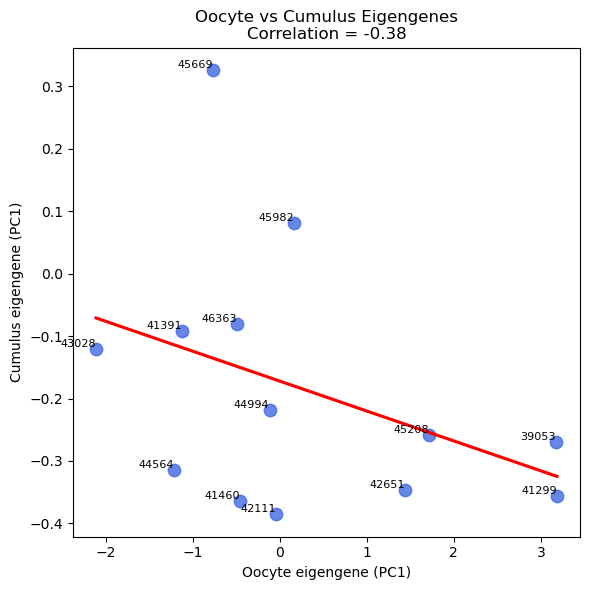

/tmp/ipykernel_984058/1127705862.py:26: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=long_df, x="CellType", y="Eigengene", hue="AnimalID",


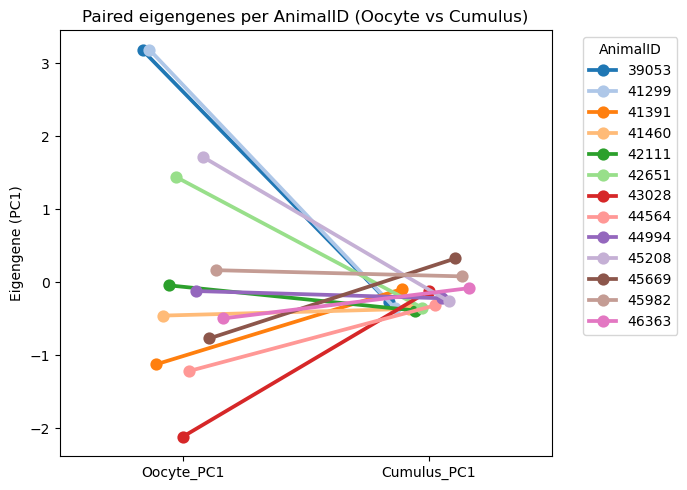

In [19]:
import seaborn as sns
# ── Step 6a: Scatterplot ──
plt.figure(figsize=(6,6))
sns.regplot(data=delta_df, x="Oocyte_PC1", y="Cumulus_PC1", ci=None,
            scatter_kws={"s":80, "color":"royalblue"}, line_kws={"color":"red"})
for _, row in delta_df.iterrows():
    plt.text(row["Oocyte_PC1"], row["Cumulus_PC1"], row["AnimalID"],
             fontsize=8, ha="right", va="bottom")
plt.title(f"Oocyte vs Cumulus Eigengenes\nCorrelation = {corr_val:.2f}")
plt.xlabel("Oocyte eigengene (PC1)")
plt.ylabel("Cumulus eigengene (PC1)")
plt.tight_layout()
plt.savefig("cumulus_eigengenes//eigengene_PC1_scatter_allpooled.png", dpi=300)
plt.show()

# ── Step 6b: Paired line plot ──
long_df = pd.melt(
    delta_df,
    id_vars=["AnimalID"],
    value_vars=["Oocyte_PC1", "Cumulus_PC1"],
    var_name="CellType",
    value_name="Eigengene"
)

plt.figure(figsize=(7,5))
sns.pointplot(data=long_df, x="CellType", y="Eigengene", hue="AnimalID",
              markers="o", dodge=True, join=True, palette="tab20")
plt.title("Paired eigengenes per AnimalID (Oocyte vs Cumulus)")
plt.ylabel("Eigengene (PC1)")
plt.xlabel("")
plt.legend(title="AnimalID", bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.savefig("cumulus_eigengenes//eigengene_PC1_paired_allpooled.png", dpi=300)
plt.show()


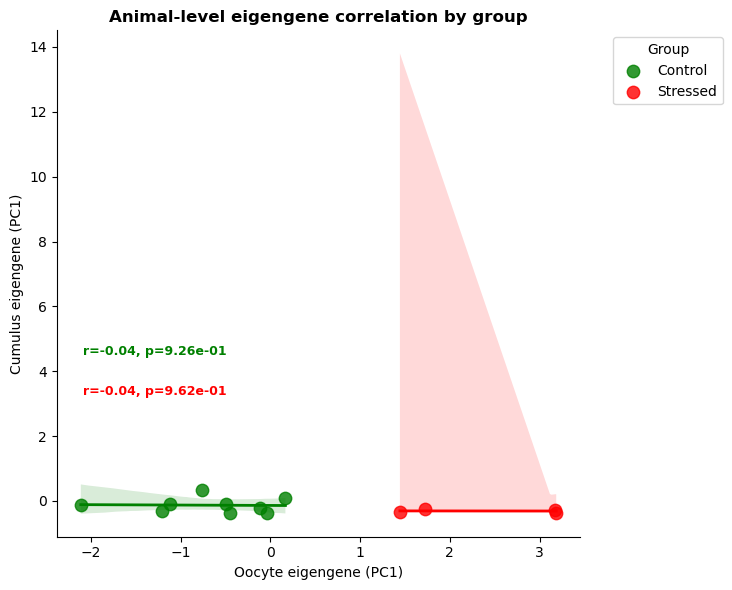

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Compute correlation per group
stats = {}
for g, sub in delta_df.groupby("Group"):
    r, p = pearsonr(sub["Oocyte_PC1"], sub["Cumulus_PC1"])
    stats[g] = (r, p)

# Define custom colors for groups
group_colors = {"Control": "green", "Stressed": "red"}

# Scatter + regression without legend
g = sns.lmplot(
    data=delta_df,
    x="Oocyte_PC1", y="Cumulus_PC1",
    hue="Group",
    palette=group_colors,
    height=6, aspect=1,
    scatter_kws={"s":80},
    line_kws={"lw":2},
    legend=False
)

# Add correlation text inside the plot
ymax = delta_df["Cumulus_PC1"].max()
ypos = ymax * 1.1
for group, (r, p) in stats.items():
    color = group_colors[group]
    plt.text(
        0.05, ypos, f"r={r:.2f}, p={p:.2e}",
        transform=plt.gca().transAxes,
        fontsize=9, color=color, fontweight="bold"
    )
    ypos -= 0.08 # stack lines

plt.title("Animal-level eigengene correlation by group", fontsize=12,  fontweight="bold")
plt.xlabel("Oocyte eigengene (PC1)")
plt.ylabel("Cumulus eigengene (PC1)")
plt.tight_layout()
plt.legend(title="Group", bbox_to_anchor=(1.05,1), loc="upper left")
plt.savefig("cumulus_eigengenes/eigengene_PC1_scatter_byGroup_corr_allpooled.png", dpi=300)
plt.show()


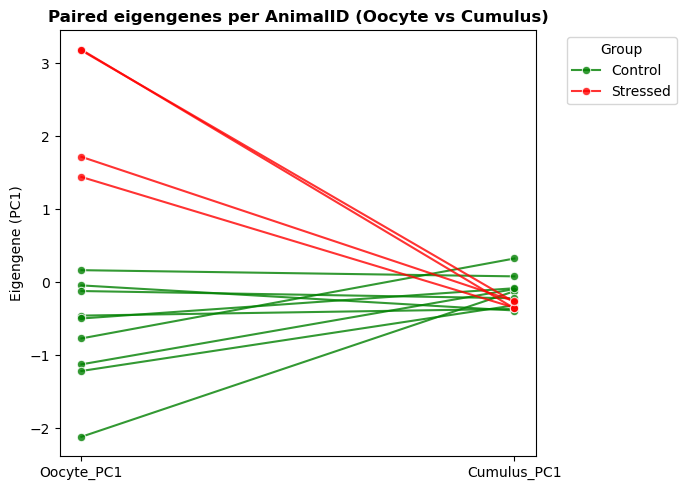

In [21]:
# ── Step 6b: Paired line plot (with Group as color) ──
long_df = pd.melt(
    delta_df,
    id_vars=["AnimalID","Group"],
    value_vars=["Oocyte_PC1", "Cumulus_PC1"],
    var_name="CellType",
    value_name="Eigengene"
)

plt.figure(figsize=(7,5))
sns.lineplot(
    data=long_df,
    x="CellType", y="Eigengene",
    hue="Group",          # color by Group
    units="AnimalID",     # connect each animal
    palette=group_colors,
    estimator=None,       # don’t average, plot each line
    marker="o", lw=1.5, alpha=0.8
)

plt.title("Paired eigengenes per AnimalID (Oocyte vs Cumulus)", fontsize=12,  fontweight="bold")
plt.ylabel("Eigengene (PC1)")
plt.xlabel("")
plt.legend(title="Group", bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.savefig("cumulus_eigengenes/eigengene_PC1_paired_byGroup_allpooled.png", dpi=300)
plt.show()


In [22]:
mcds_pathsO = "../../oocytes-macaque/allcools/allcools-subsampled/alloocytes/results-pooled/genebody_frac.mcds/"
mcds_oocyte = MCDS.open(mcds_pathsO)
mcds_oocyte

<xarray.MCDS>
Dimensions:            (cell: 46, genebody: 26940, mc_type: 2)
Coordinates:
  * cell               (cell) <U20 '4146045001PO3NC4G4C' ... '4123744641PO1NC...
  * genebody           (genebody) <U18 'ENSMMUG00000023296' ... 'ENSMMUG00000...
    genebody_chrom     (genebody) <U5 'chr1' 'chr1' 'chr1' ... 'chrX' 'chrX'
    genebody_cov_mean  (genebody) float64 964.3 1.281e+03 ... 261.2 69.3
    genebody_end       (genebody) int64 26653 83178 ... 151987003 152565575
    genebody_start     (genebody) int64 8230 71581 81257 ... 151983199 152564067
  * mc_type            (mc_type) <U3 'CGN' 'CHN'
Data variables:
    genebody_da_frac   (cell, genebody, mc_type) float32 dask.array<chunksize=(46, 26940, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  genebody

      Group  n    t_stat    t_pval  wilcoxon_stat  wilcoxon_pval
0   Control  9 -2.200182  0.058977            8.0       0.097656
1  Stressed  4  5.758620  0.010406            0.0       0.125000


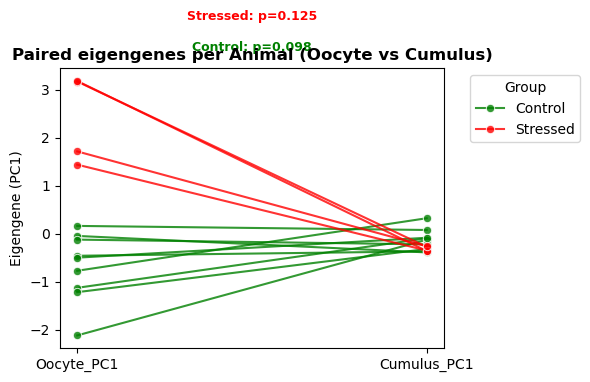

In [23]:
from scipy.stats import ttest_rel, wilcoxon
import seaborn as sns
import matplotlib.pyplot as plt

# ── Long format for plotting ──
long_df = pd.melt(
    delta_df,
    id_vars=["AnimalID","Group"],
    value_vars=["Oocyte_PC1", "Cumulus_PC1"],
    var_name="CellType",
    value_name="Eigengene"
)

# ── Paired line plot ──
plt.figure(figsize=(6,4))
ax = sns.lineplot(
    data=long_df,
    x="CellType", y="Eigengene",
    hue="Group",
    units="AnimalID",
    palette=group_colors,
    estimator=None,
    marker="o", lw=1.5, alpha=0.8
)


plt.title("Paired eigengenes per Animal (Oocyte vs Cumulus)", fontsize=12,  fontweight="bold")
plt.ylabel("Eigengene (PC1)")
plt.xlabel("")
plt.legend(title="Group", bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()

from scipy.stats import ttest_rel, wilcoxon
import matplotlib.pyplot as plt
import pandas as pd

# Define group colors explicitly
group_colors = {"Control": "green", "Stressed": "red"}

# ── Paired tests per group ──
results = []
y_offset = 0.1 * (long_df["Eigengene"].max() - long_df["Eigengene"].min())

for i, (g, sub) in enumerate(delta_df.groupby("Group")):
    # Paired tests
    r = ttest_rel(sub["Oocyte_PC1"], sub["Cumulus_PC1"])
    w = wilcoxon(sub["Oocyte_PC1"], sub["Cumulus_PC1"])
    
    results.append({
        "Group": g,
        "n": len(sub),
        "t_stat": r.statistic, "t_pval": r.pvalue,
        "wilcoxon_stat": w.statistic, "wilcoxon_pval": w.pvalue
    })
    
    # Annotate on plot (text color = group color)
    xpos = 0.5  # halfway between Oocyte and Cumulus
    ypos = long_df["Eigengene"].max() + (i+1) * y_offset * 1.2
    plt.text(
        xpos, ypos,
        f"{g}: p={w.pvalue:.3f}",
        ha="center", fontsize=9, color=group_colors.get(g, "black"), fontweight="bold"
    )

stats_df = pd.DataFrame(results)
print(stats_df)

# Save stats
stats_df.to_csv("cumulus_eigengenes/eigengene_PC1_paired_stats_allpooled.csv", index=False)

plt.tight_layout()
plt.savefig("cumulus_eigengenes/eigengene_PC1_paired_byGroup_stat_allpooled.png", dpi=300)
plt.show()


      Group  n    t_stat    t_pval  wilcoxon_stat  wilcoxon_pval
0   Control  9 -2.200182  0.058977            8.0       0.097656
1  Stressed  4  5.758620  0.010406            0.0       0.125000


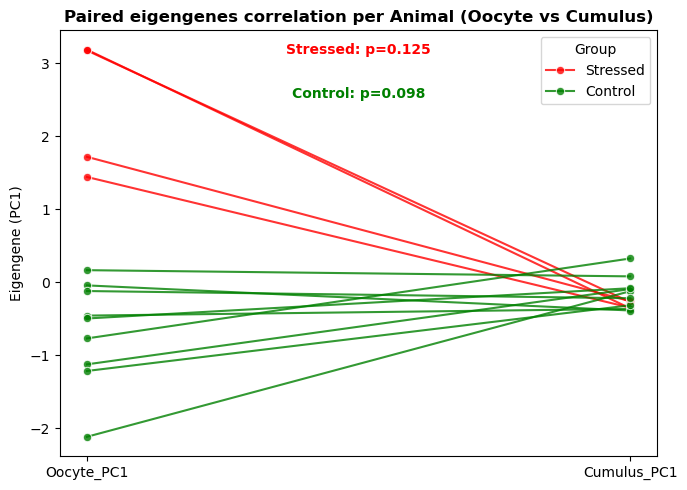

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel, wilcoxon

# ── Long format for plotting ──
long_df = pd.melt(
    delta_df,
    id_vars=["AnimalID","Group"],
    value_vars=["Oocyte_PC1", "Cumulus_PC1"],
    var_name="CellType",
    value_name="Eigengene"
)

# Standardize group labels (important for color mapping)
delta_df["Group"] = delta_df["Group"].str.strip().str.capitalize()
long_df["Group"]  = long_df["Group"].str.strip().str.capitalize()

# Define consistent colors
group_colors = {"Control": "green", "Stressed": "red"}

# ── Paired line plot ──
plt.figure(figsize=(7,5))
ax = sns.lineplot(
    data=long_df,
    x="CellType", y="Eigengene",
    hue="Group",
    units="AnimalID",
    palette=group_colors,
    estimator=None,
    marker="o", lw=1.5, alpha=0.8
)

plt.title("Paired eigengenes correlation per Animal (Oocyte vs Cumulus)",
          fontsize=12, fontweight="bold")
plt.ylabel("Eigengene (PC1)")
plt.xlabel("")
plt.tight_layout()

# ── Paired tests per group ──
results = []
y_offset = 0.1 * (long_df["Eigengene"].max() - long_df["Eigengene"].min())

for i, (g, sub) in enumerate(delta_df.groupby("Group")):
    # Paired tests
    r = ttest_rel(sub["Oocyte_PC1"], sub["Cumulus_PC1"])
    w = wilcoxon(sub["Oocyte_PC1"], sub["Cumulus_PC1"])
    
    results.append({
        "Group": g,
        "n": len(sub),
        "t_stat": r.statistic, "t_pval": r.pvalue,
        "wilcoxon_stat": w.statistic, "wilcoxon_pval": w.pvalue
    })
    
    # Annotate results in group color
    xpos = 0.5
    ypos = long_df["Eigengene"].max()*0.6 + (i+1) * y_offset * 1.15
    plt.text(
        xpos, ypos,
        f"{g}: p={w.pvalue:.3f}",
        ha="center", fontsize=10,
        color=group_colors[g],
        fontweight="bold"
    )

# Save stats table
stats_df = pd.DataFrame(results)
print(stats_df)
stats_df.to_csv("cumulus_eigengenes/eigengene_PC1_paired_stats_allpooled.csv", index=False)

# Save plot
plt.savefig("cumulus_eigengenes/eigengene_PC1_paired_byGroup_stat_allpooled.png", dpi=300)
plt.show()


In [33]:
#

# Map gene_id -> genename (optional)
gene_name_map = genes_df.dropna(subset=["genename"]).set_index("gene")["genename"].to_dict()

# Choose mc_type separately for CGN/CHN
mc_type = "CGN"   # or "CHN"

# β tables
 
sc_oocyte = mcds_gene_beta_frac(mcds_oocyte, mc_type=mc_type, min_cov=5, genes=gene_list)
sc_cumulus = mcds_gene_beta_frac(mcds_cumulus, mc_type=mc_type, min_cov=5, genes=gene_list)

In [26]:
sc_oocyte

,cell,gene,mc_type,beta
0,4146045001PO3NC4G4C,ENSMMUG00000000157,CGN,0.560029
1,4146045001PO3NC4G4C,ENSMMUG00000001570,CGN,0.461497
2,4146045001PO3NC4G4C,ENSMMUG00000003201,CGN,1.000000
3,4146045001PO3NC4G4C,ENSMMUG00000003412,CGN,0.259770
4,4146045001PO3NC4G4C,ENSMMUG00000004507,CGN,0.102057
...,...,...,...,...
3399,4123744641PO1NC4N2S,ENSMMUG00000064414,CGN,1.092601
3400,4123744641PO1NC4N2S,ENSMMUG00000064711,CGN,0.566650
3401,4123744641PO1NC4N2S,ENSMMUG00000064772,CGN,0.037696
3402,4123744641PO1NC4N2S,ENSMMUG00000065344,CGN,0.133830


In [34]:
# per gene -smoothed methylation value 

# 1) Suppose df_oocyte and df_cumulus are your per-cell gene-level smoothed betas
# Format: columns = ["cell","gene","beta"], plus metadata with AnimalID, Group
df_oocyte = sc_oocyte.merge(meta_oocyte[["cell","AnimalID","Group"]], on="cell")
df_cumulus = sc_cumulus.merge(meta_cumulus[["cell","AnimalID","Group"]], on="cell")

# 2) Aggregate to AnimalID × gene (average across cells per animal per gene)
o_by_id = df_oocyte.groupby(["AnimalID","Group","gene"], as_index=False)["beta"].mean().rename(
    columns={"beta":"Oocyte_beta"})
c_by_id = df_cumulus.groupby(["AnimalID","Group","gene"], as_index=False)["beta"].mean().rename(
    columns={"beta":"Cumulus_beta"})

# 3) Merge oocyte + cumulus for common AnimalIDs
delta_df = o_by_id.merge(c_by_id, on=["AnimalID","Group","gene"], how="inner")

# Optional: add gene names
delta_df["genename"] = delta_df["gene"].map(gene_name_map).fillna(delta_df["gene"])


In [35]:
delta_df.dropna()

,AnimalID,Group,gene,Oocyte_beta,Cumulus_beta,genename
0,39053,Stressed,ENSMMUG00000000157,1.000000,0.312578,DLX3
1,39053,Stressed,ENSMMUG00000001570,0.861050,0.454508,TTC32
2,39053,Stressed,ENSMMUG00000003201,0.080140,0.431937,MID1IP1
3,39053,Stressed,ENSMMUG00000003412,0.966168,0.512402,RPS6
4,39053,Stressed,ENSMMUG00000004507,1.396981,0.099673,GSX1
...,...,...,...,...,...,...
1105,46363,Control,ENSMMUG00000064414,1.079743,1.068354,ENSMMUG00000064414
1106,46363,Control,ENSMMUG00000064711,0.442111,0.853816,LGALSL
1107,46363,Control,ENSMMUG00000064772,0.146906,0.056323,FEV
1108,46363,Control,ENSMMUG00000065344,0.122604,0.116657,HOXD1


In [36]:
# per gene
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib



group_colors = {
    "Control": "green",
    "Stressed": "red"
}
stats = []

# ── Filter out NA groups (Strfrom scipy.stats import pearsonr

for (g, group), sub in delta_df.groupby(["genename","Group"]):
    sub_clean = sub.replace([np.inf, -np.inf], np.nan).dropna(subset=["Oocyte_beta","Cumulus_beta"])
    n = len(sub_clean)
    if n > 2 and sub_clean["Oocyte_beta"].nunique() > 1 and sub_clean["Cumulus_beta"].nunique() > 1:
        r, p = pearsonr(sub_clean["Oocyte_beta"], sub_clean["Cumulus_beta"])
        stats.append({"genename": g, "Group": group, "r": r, "p": p, "n": n})
# Make stats dataframe
stats_df = pd.DataFrame(stats)

# ── Filter out NA groups (Stress/Control with too few points) ──
valid_groups = stats_df.dropna(subset=["r"])["Group"].unique()
delta_plot = delta_df.merge(stats_df, on=["genename","Group"], how="inner")

# ── Order genes by |R| and then p-value ──
gene_order = (
    stats_df.assign(absR=lambda d: d["r"].abs())
    .sort_values(["absR","p"], ascending=[False,True])
    ["genename"]
    .unique()
)
delta_plot["genename"] = pd.Categorical(delta_plot["genename"], categories=gene_order, ordered=True)

# ── Multi-panel scatter ──
g = sns.FacetGrid(delta_plot, col="genename", col_wrap=5, height=2.8,
                  sharex=False, sharey=False, hue="Group", palette=group_colors)
g.map_dataframe(sns.scatterplot, x="Oocyte_beta", y="Cumulus_beta")
g.map_dataframe(sns.regplot, x="Oocyte_beta", y="Cumulus_beta",
                scatter=False, ci=None)

# ── Customize facet titles ──
for ax, title in zip(g.axes.flatten(), g.col_names):
    ax.set_title(title, fontweight="bold", fontsize=10)  # bold, no "genename="


# ── Annotate R, p per group ──
for ax, (gene, sub) in zip(g.axes.flatten(), delta_plot.groupby("genename")):
    ypos = 0.9
    for group_name, sub_group in sub.groupby("Group"):
        r, p, n = sub_group[["r","p","n"]].iloc[0]
        
        # Annotate without group name, just colored text
        ax.text(
            0.05, ypos,
            f"R={r:.2f}, p={p:.3f} (n={n})",
            transform=ax.transAxes,
            fontsize=7,
            color=group_colors[group_name],   # color by group
            fontweight="bold"
        )
        ypos -= 0.12


g.set_axis_labels("Oocyte smoothed methylation", "Cumulus smoothed methylation")
# After creating g with FacetGrid
g.add_legend(title="Group")





plt.legend(loc="lower right")
plt.tight_layout()
#plt.savefig("cumulus_eigengenes/pooledallgenes_cumulus_oocyte_pergene_scatter_sorted.png", dpi=300)
#plt.savefig("cumulus_eigengenes/pooledallgenes_cumulus_oocyte_pergene_scatter_sorted.png", dpi=300)
plt.show()


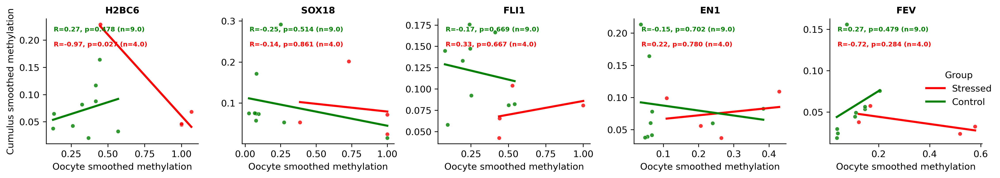

In [32]:
# only those in
# ── Imports ────────────────────────────────────────────────────────────────
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['savefig.transparent'] = True
matplotlib.rcParams['path.simplify'] = False  # keep exact vectors

# ── Define colors ──────────────────────────────────────────────────────────
group_colors = {
    "Control": "green",
    "Stressed": "red"
}

# ── Compute per-gene Pearson correlation ───────────────────────────────────
stats = []

for (g, group), sub in delta_df.groupby(["genename", "Group"]):
    sub_clean = sub.replace([np.inf, -np.inf], np.nan).dropna(subset=["Oocyte_beta", "Cumulus_beta"])
    n = len(sub_clean)
    if n > 2 and sub_clean["Oocyte_beta"].nunique() > 1 and sub_clean["Cumulus_beta"].nunique() > 1:
        r, p = pearsonr(sub_clean["Oocyte_beta"], sub_clean["Cumulus_beta"])
        stats.append({"genename": g, "Group": group, "r": r, "p": p, "n": n})

stats_df = pd.DataFrame(stats)

# ── Select only these genes ────────────────────────────────────────────────
genes_to_plot = ["H2BC6", "SOX18", "FLI1", "EN1", "FEV"]

# Keep both groups but only for these genes
delta_plot = delta_df[delta_df["genename"].isin(genes_to_plot)].merge(
    stats_df, on=["genename", "Group"], how="inner"
)

# ── Preserve order of selected genes ───────────────────────────────────────
delta_plot["genename"] = pd.Categorical(
    delta_plot["genename"],
    categories=genes_to_plot,
    ordered=True
)

# ── Multi-panel scatter plots ──────────────────────────────────────────────
g = sns.FacetGrid(
    delta_plot,
    col="genename",
    col_wrap=5,
    height=2.8,
    sharex=False,
    sharey=False,
    hue="Group",
    palette=group_colors
)
g.map_dataframe(sns.scatterplot, x="Oocyte_beta", y="Cumulus_beta", alpha=0.8, s=20)
g.map_dataframe(sns.regplot, x="Oocyte_beta", y="Cumulus_beta", scatter=False, ci=None)

# ── Customize facet titles ─────────────────────────────────────────────────
for ax, title in zip(g.axes.flatten(), g.col_names):
    ax.set_title(title, fontweight="bold", fontsize=10)

# ── Annotate correlation stats per group ───────────────────────────────────
for ax, (gene, sub) in zip(g.axes.flatten(), delta_plot.groupby("genename")):
    ypos = 0.9
    for group_name, sub_group in sub.groupby("Group"):
        r, p, n = sub_group[["r", "p", "n"]].iloc[0]
        ax.text(
            0.05, ypos,
            f"R={r:.2f}, p={p:.3f} (n={n})",
            transform=ax.transAxes,
            fontsize=7,
            color=group_colors[group_name],
            fontweight="bold"
        )
        ypos -= 0.12

# ── Label axes, legend, and save ───────────────────────────────────────────
g.set_axis_labels("Oocyte smoothed methylation", "Cumulus smoothed methylation")
g.add_legend(title="Group")

plt.tight_layout()
plt.savefig("cumulus_eigengenes/panelE_sf7.pdf", dpi=300)
plt.show()


In [51]:
# per gene -smoothed methylation value - no aggregation per animal
# 1) Merge metadata onto each dataset
df_oocyte = sc_oocyte.merge(meta_oocyte[["cell","AnimalID","Group"]], on="cell")
df_cumulus = sc_cumulus.merge(meta_cumulus[["cell","AnimalID","Group"]], on="cell")

# 2) Keep per-sample values (no groupby-mean)
df_oocyte = df_oocyte.rename(columns={"beta": "Oocyte_beta"})
df_cumulus = df_cumulus.rename(columns={"beta": "Cumulus_beta"})

# 3) Merge on cell/gene? or AnimalID/gene?
#    If you have distinct sample IDs for oocyte vs cumulus, use ["AnimalID","gene","Group"]
delta_df = df_oocyte.merge(df_cumulus, on=["AnimalID","Group","gene"], how="inner")

# 4) Add gene names (optional)
delta_df["genename"] = delta_df["gene"].map(gene_name_map).fillna(delta_df["gene"])


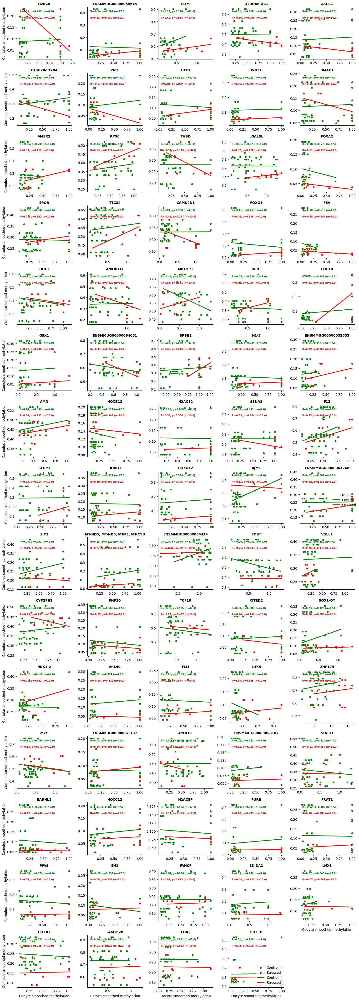

In [52]:
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib


# Define group colors
group_colors = {
    "Control": "green",
    "Stressed": "red"
}
stats = []
for (g, group), sub in delta_df.groupby(["genename","Group"]):
    sub_clean = sub.replace([np.inf, -np.inf], np.nan).dropna(subset=["Oocyte_beta","Cumulus_beta"])
    n = len(sub_clean)
    if n > 2 and sub_clean["Oocyte_beta"].nunique() > 1 and sub_clean["Cumulus_beta"].nunique() > 1:
        r, p = pearsonr(sub_clean["Oocyte_beta"], sub_clean["Cumulus_beta"])
        stats.append({"genename": g, "Group": group, "r": r, "p": p, "n": n})
# Make stats dataframe
stats_df = pd.DataFrame(stats)

# ── Filter out NA groups (Stress/Control with too few points) ──
valid_groups = stats_df.dropna(subset=["r"])["Group"].unique()
delta_plot = delta_df.merge(stats_df, on=["genename","Group"], how="inner")

# ── Order genes by |R| and then p-value ──
gene_order = (
    stats_df.assign(absR=lambda d: d["r"].abs())
    .sort_values(["absR","p"], ascending=[False,True])
    ["genename"]
    .unique()
)
delta_plot["genename"] = pd.Categorical(delta_plot["genename"], categories=gene_order, ordered=True)

# ── Multi-panel scatter ──
g = sns.FacetGrid(
    delta_plot, col="genename", col_wrap=5, height=2.8,
    sharex=False, sharey=False, hue="Group", palette=group_colors
)
g.map_dataframe(sns.scatterplot, x="Oocyte_beta", y="Cumulus_beta")
g.map_dataframe(sns.regplot, x="Oocyte_beta", y="Cumulus_beta",
                scatter=False, ci=None)

# ── Customize facet titles ──
for ax, title in zip(g.axes.flatten(), g.col_names):
    ax.set_title(title, fontweight="bold", fontsize=10)  # bold, no "genename="



# ── Annotate R, p per group ──
for ax, (gene, sub) in zip(g.axes.flatten(), delta_plot.groupby("genename")):
    ypos = 0.9
    for group_name, sub_group in sub.groupby("Group"):
        r, p, n = sub_group[["r","p","n"]].iloc[0]
        
        # Annotate without group name, just colored text
        ax.text(
            0.05, ypos,
            f"R={r:.2f}, p={p:.3f} (n={n})",
            transform=ax.transAxes,
            fontsize=7,
            color=group_colors[group_name],   # color by group
            fontweight="bold"
        )
        ypos -= 0.12

g.set_axis_labels("Oocyte smoothed methylation", "Cumulus smoothed methylation")
# After creating g with FacetGrid
g.add_legend(title="Group")





plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("cumulus_eigengenes/pooledallgenes_cumulus_oocyte_pergene_scatter_sortedd_noaggregatePerAnimal.png", dpi=300)
plt.show()


In [53]:
#
#genes_df = pd.read_csv("mCG_genenames_coords_withlifted.csv")
# adjust column names to your file structure
gene_name_map = dict(zip(genes_df["gene"], genes_df["genename"]))

# Assuming you have metadata with columns: cell, AnimalID, Stage, Group
#meta = pd.concat([meta_oocyte, meta_cumulus])  # or however you have it

df_oocyte = mcds_gene_beta_frac(mcds_oocyte, mc_type="CGN", genes=gene_list)
df_cumulus = mcds_gene_beta_frac(mcds_cumulus, mc_type="CGN", genes=gene_list)
df_oocyte["Stage"] = "Oocyte"
df_cumulus["Stage"] = "Cumulus"


df_cumulus = df_cumulus.merge(meta_cumulus[["cell","AnimalID","Group"]], on="cell")
df_oocyte =df_oocyte.merge(meta_oocyte[["cell","AnimalID","Group"]], on = "cell")
df = pd.concat([df_oocyte, df_cumulus], ignore_index=True)
df

,cell,gene,mc_type,beta,Stage,AnimalID,Group
0,4146045001PO3NC4G4C,ENSMMUG00000000157,CGN,0.560029,Oocyte,41460,Control
1,4146045001PO3NC4G4C,ENSMMUG00000001570,CGN,0.461497,Oocyte,41460,Control
2,4146045001PO3NC4G4C,ENSMMUG00000003201,CGN,1.000000,Oocyte,41460,Control
3,4146045001PO3NC4G4C,ENSMMUG00000003412,CGN,0.259770,Oocyte,41460,Control
4,4146045001PO3NC4G4C,ENSMMUG00000004507,CGN,0.102057,Oocyte,41460,Control
...,...,...,...,...,...,...,...
4805,MC92,ENSMMUG00000064414,CGN,1.007282,Cumulus,46363,Control
4806,MC92,ENSMMUG00000064711,CGN,1.001869,Cumulus,46363,Control
4807,MC92,ENSMMUG00000064772,CGN,0.031291,Cumulus,46363,Control
4808,MC92,ENSMMUG00000065344,CGN,0.130766,Cumulus,46363,Control


In [54]:

# ── Define TF list ──
highlight_tfs = [
    'BARHL2','FOXA2','SOX18','HOXC12','ASCL4','LHX5','EN1',
    'HOXD12','HOXD1','FEV','LHX3','DLX3','HOXB13','GSX1',
    'CDX2','ZIC1','ZNF174','PURB','HOXA7','VGLL2','CITED2',
    'TCF19','FOXQ1','MYC','NKX1-2','FLI1','UTF1','ZIC3'
]

# ── Gene ID → Name mapping ──
genes_df.columns = ["gene_id", "chr", "start", "end", "genename"]
gene_id_to_name = genes_df.dropna(subset=['genename']).set_index("gene_id")["genename"].to_dict()




/tmp/ipykernel_939785/1741770851.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


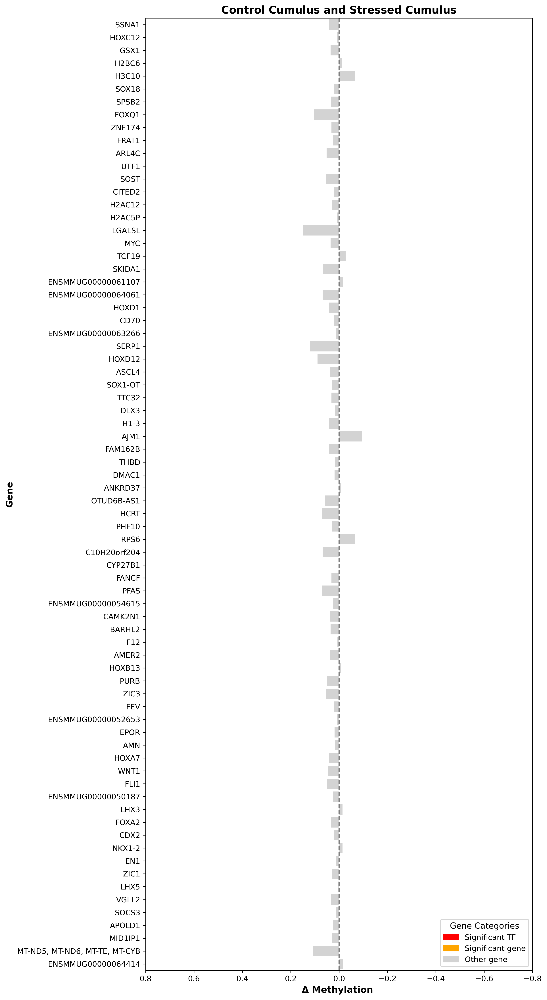

/tmp/ipykernel_939785/1741770851.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


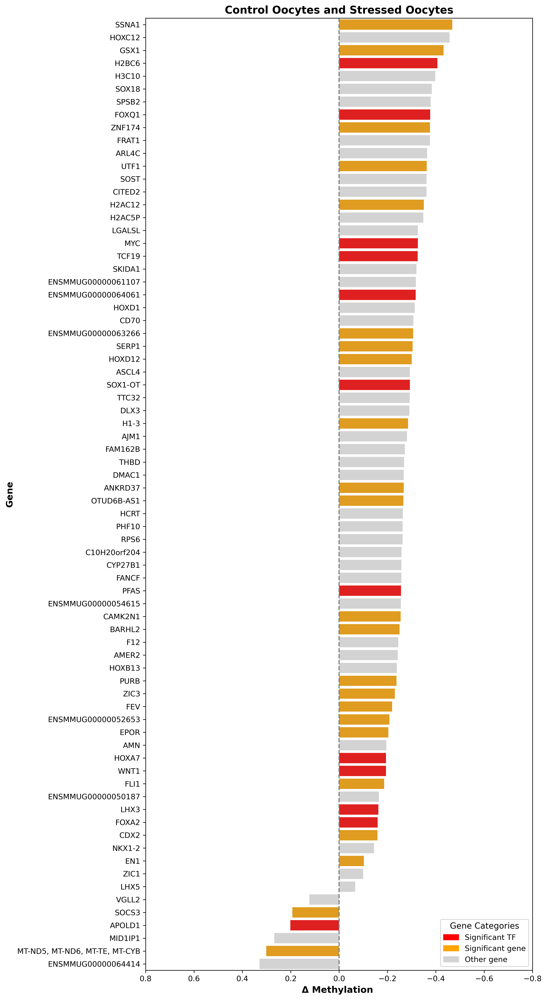

/tmp/ipykernel_939785/1741770851.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


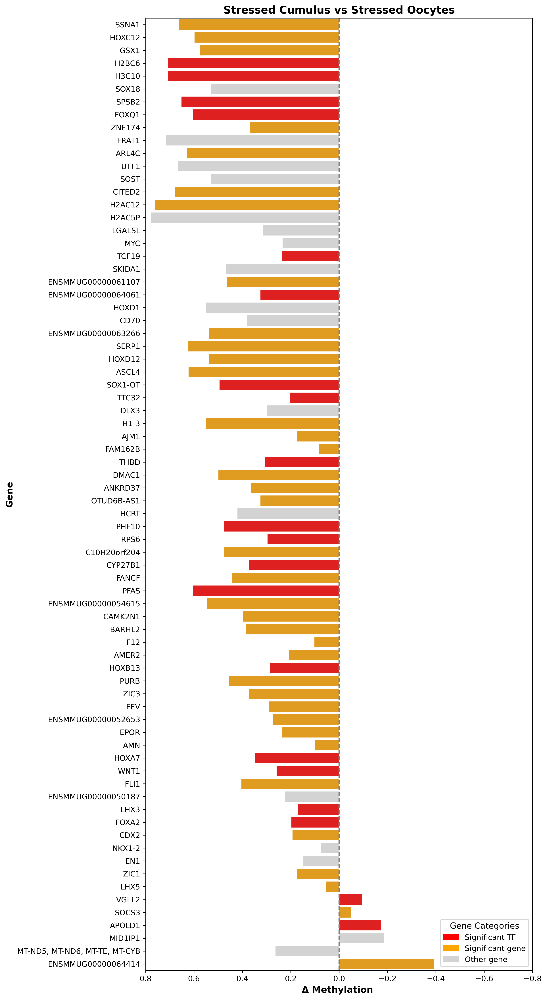

/tmp/ipykernel_939785/1741770851.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


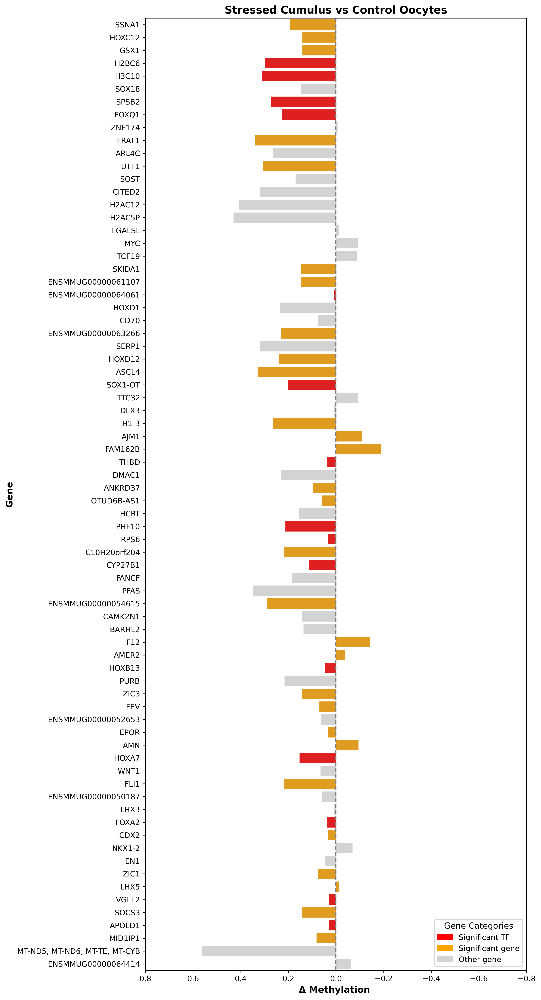

/tmp/ipykernel_939785/1741770851.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


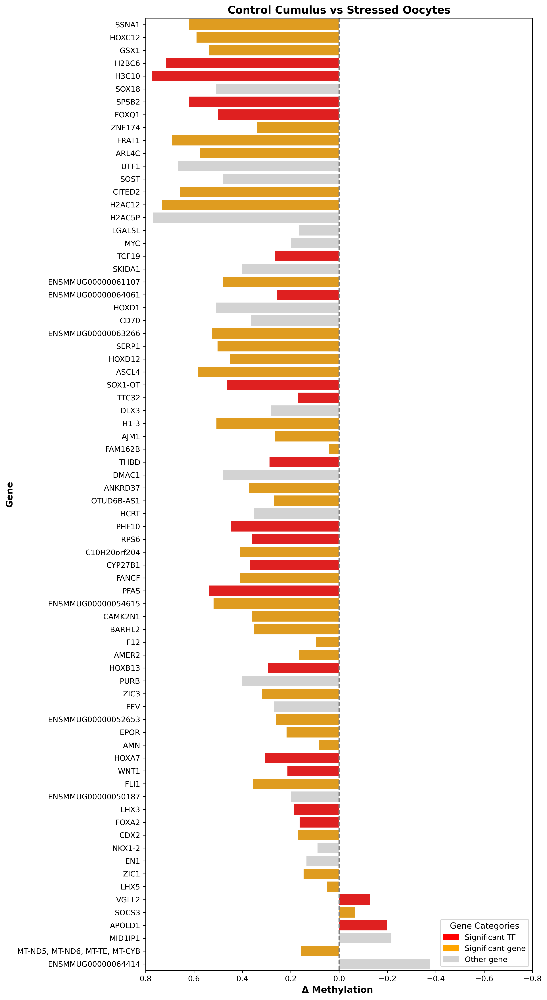

/tmp/ipykernel_939785/1741770851.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


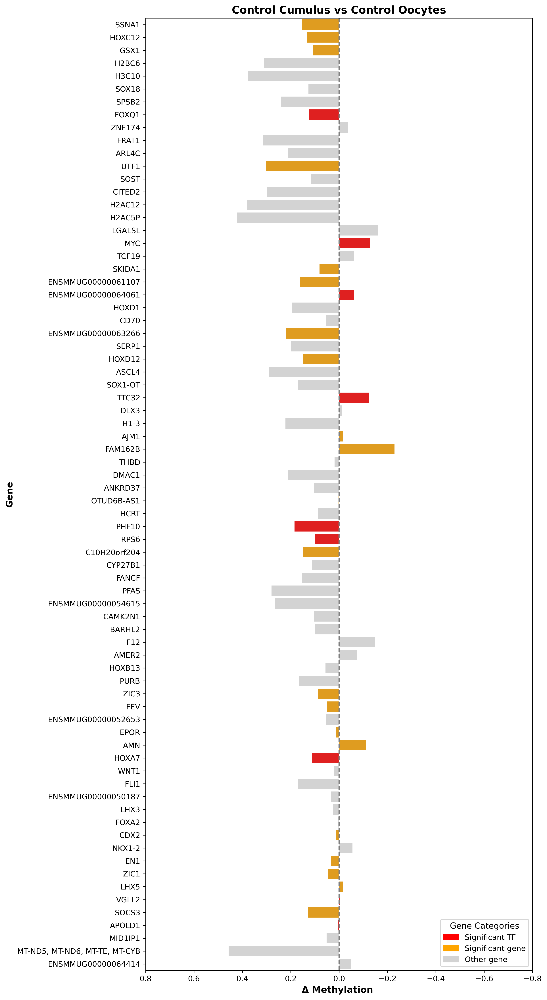

In [66]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
import matplotlib


def compare_cross(df, stage1, group1, stage2, group2, value_col="beta"):
    """
    Compare per-gene methylation fractions between two Stage/Group subsets.
    Returns a DataFrame with delta, pval, FDR, significance flags.
    """
    results = []
    sub1 = df[(df["Stage"] == stage1) & (df["Group"] == group1)]
    sub2 = df[(df["Stage"] == stage2) & (df["Group"] == group2)]

    for gene in set(sub1["gene"]).intersection(sub2["gene"]):
        vals1 = sub1.loc[sub1["gene"] == gene, value_col].dropna()
        vals2 = sub2.loc[sub2["gene"] == gene, value_col].dropna()

        if len(vals1) > 1 and len(vals2) > 1:
            _, pval = ttest_ind(vals2, vals1, equal_var=False)
        else:
            pval = 1.0

        results.append({
            "gene": gene,
            "genename": gene_name_map.get(gene, gene),
            f"{stage1}_{group1}_mean": vals1.mean(),
            f"{stage2}_{group2}_mean": vals2.mean(),
            "delta": vals1.mean() - vals2.mean(),
            "pval": pval
        })

    res = pd.DataFrame(results)
    if not res.empty:
        res["fdr"] = multipletests(res["pval"], method="fdr_bh")[1]
        res["significant"] = (res["fdr"] < 0.05) & (res["delta"].abs() > 0.05)
        res["is_tf"] = res["genename"].isin(highlight_tfs)
    return res


# ── Run cross-comparisons ──
comparisons = {
    "Control Cumulus and Stressed Cumulus": compare_cross(df, "Cumulus", "Control", "Cumulus", "Stressed"),
    "Control Oocytes and Stressed Oocytes": compare_cross(df, "Oocyte", "Control", "Oocyte", "Stressed"),
    "Stressed Cumulus vs Stressed Oocytes": compare_cross(df, "Oocyte", "Stressed", "Cumulus", "Stressed"),
    "Stressed Cumulus vs Control Oocytes": compare_cross(df, "Oocyte", "Control", "Cumulus", "Stressed"),
    "Control Cumulus vs Stressed Oocytes": compare_cross(df, "Oocyte", "Stressed", "Cumulus", "Control"),
    "Control Cumulus vs Control Oocytes": compare_cross(df, "Oocyte", "Control", "Cumulus", "Control"),
}
# ── Define reference order from Control vs Stressed Oocytes ──
ref_comp = comparisons["Control Oocytes and Stressed Oocytes"]
if not ref_comp.empty:
    # Fallback: if genename is NaN, use gene_id
    ref_comp["genename"] = ref_comp.apply(
        lambda row: row["gene"] if pd.isna(row["genename"]) else row["genename"], axis=1
    )
    reference_order = ref_comp.sort_values("delta", ascending=True)["genename"].tolist()
else:
    reference_order = None
    
    
# ── Output and plotting ──
outdir = "cumulus-nonNorm/comparison_outputs_cross_pooledhyper"
os.makedirs(outdir, exist_ok=True)

for name, res in comparisons.items():
    res.to_csv(f"{outdir}/{name}.csv", index=False)

    if res.empty:
        print(f"⚠️ No results for {name}, skipping plot.")
        continue

    # Ensure no NaN genenames (fallback to gene_id)
    res["genename"] = res.apply(
        lambda row: row["gene"] if pd.isna(row["genename"]) else row["genename"], axis=1
    )

    # Apply consistent order (from Control vs Stressed Oocytes)
    if reference_order is not None:
        res["genename"] = pd.Categorical(
            res["genename"],
            categories=reference_order,
            ordered=True
        )

    height = min(0.25 * len(res), 20)
    plt.figure(figsize=(10, height))

    colors = [
        "red" if row["significant"] and row["is_tf"]
        else "orange" if row["significant"]
        else "lightgray"
        for _, row in res.iterrows()
    ]

    sns.barplot(
        data=res.sort_values("genename"),  # preserves reference order
        x="delta", y="genename", palette=colors, dodge=False
    )

    plt.axvline(0, linestyle="--", color="gray")
    plt.title(name.replace("_", " "), fontsize=14, fontweight="bold")
    plt.xlabel("Δ Methylation ", fontsize=12, fontweight="bold")
    plt.ylabel("Gene", fontsize=12, fontweight="bold")

    legend_patches = [
        mpatches.Patch(color="red", label="Significant TF"),
        mpatches.Patch(color="orange", label="Significant gene"),
        mpatches.Patch(color="lightgray", label="Other gene")
    ]
    plt.legend(handles=legend_patches, title="Gene Categories",
               fontsize=10, title_fontsize=11, loc="lower right")

    plt.tight_layout()
    plt.xlim(0.8,-0.8)
   # plt.savefig(f"{outdir}/{name}_barplot_ordered.png", dpi=300)
    plt.show()


In [56]:
#reference_order = ref_comp.sort_values("delta", ascending=True)["genename"].tolist()


/tmp/ipykernel_939785/3682582227.py:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_939785/3682582227.py:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_939785/3682582227.py:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_939785/3682582227.py:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_939785/3682582227.py:56: FutureWa

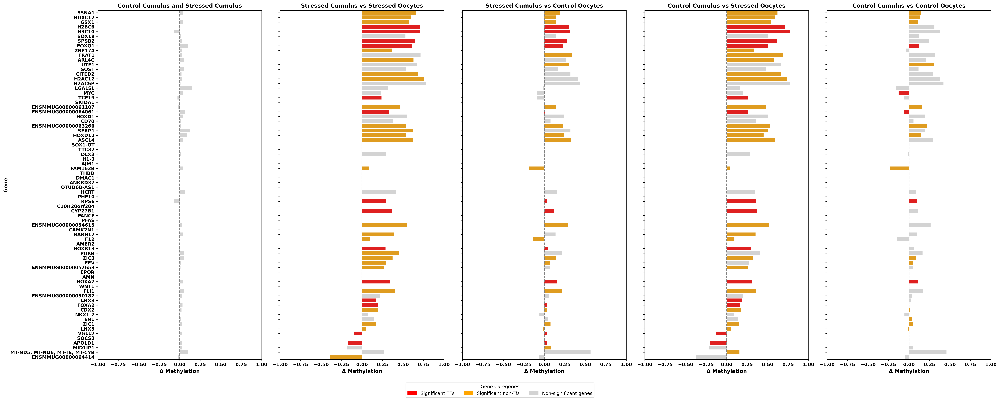

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['savefig.transparent'] = True
matplotlib.rcParams['path.simplify'] = False  # keep exact vectors

# ── Define reference order from Control vs Stressed Oocytes ──
ref_comp = comparisons["Control Oocytes and Stressed Oocytes"]
if not ref_comp.empty:
    ref_comp["genename"] = ref_comp.apply(
        lambda row: row["gene"] if pd.isna(row["genename"]) else row["genename"], axis=1
    )
    reference_order = ref_comp.sort_values("delta", ascending=True)["genename"].tolist()
else:
    reference_order = None

# ── Prepare plotting ──
outdir = "figure6/comparison_outputs_cross_multi"
os.makedirs(outdir, exist_ok=True)

# Exclude the oocyte vs oocyte baseline
plot_comparisons = {k: v for k, v in comparisons.items() if k != "Control Oocytes and Stressed Oocytes"}

n = len(plot_comparisons)
fig, axes = plt.subplots(1, n, figsize=(6*n, 12), sharey=True)

if n == 1:
    axes = [axes]  # ensure iterable

for ax, (name, res) in zip(axes, plot_comparisons.items()):
    if res.empty:
        print(f"⚠️ No results for {name}, skipping panel.")
        continue

    # Fallback genename
    res["genename"] = res.apply(
        lambda row: row["gene"] if pd.isna(row["genename"]) else row["genename"], axis=1
    )

    # Apply consistent order
    if reference_order is not None:
        res["genename"] = pd.Categorical(res["genename"], categories=reference_order, ordered=True)

    # Colors
    colors = [
        "red" if row["significant"] and row["is_tf"]
        else "orange" if row["significant"]
        else "lightgray"
        for _, row in res.iterrows()
    ]

    sns.barplot(
        data=res.sort_values("genename"),  # respect reference order
        x="delta", y="genename", palette=colors, dodge=False, ax=ax
    )

    ax.axvline(0, linestyle="--", color="gray")
    ax.set_title(name.replace("_", " "), fontsize=12, fontweight="bold")
    #ax.set_xlabel("Δ Methylation")
    ax.set_xlabel("Δ Methylation", fontsize=11, fontweight="bold")
    ax.set_ylabel("Gene", fontsize=11, fontweight="bold")

        # ✅ keep consistent x-axis across animals
    ax.set_xlim(-1, 1)

        # ✅ bold ticksax.set_xticks
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontweight("bold")
        
    if ax == axes[0]:
        ax.set_ylabel("Gene")
    else:
        ax.set_ylabel("")
        
for ax in axes:
    ax.set_xlim(-1, 1)

        
# Legend (global)
legend_patches = [
    mpatches.Patch(color="red", label="Significant TFs"),
    mpatches.Patch(color="orange", label="Significant non-Tfs"),
    mpatches.Patch(color="lightgray", label="Non-significant genes")
]
fig.legend(handles=legend_patches, title="Gene Categories", loc="lower center", ncol=3)

plt.tight_layout(rect=[0, 0.05, 1, 1])  # leave space for legend
#plt.savefig(f"{outdir}/multi_panel_barplots_forfig6.pdf",)
plt.savefig(f"{outdir}/panelA_forfig7.pdf", bbox_inches="tight")
plt.show()


/tmp/ipykernel_939785/1268870122.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_939785/1268870122.py:65: UserWarning: The palette list has more values (74) than needed (51), which may not be intended.
  sns.barplot(
/tmp/ipykernel_939785/1268870122.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_939785/1268870122.py:65: UserWarning: The palette list has more values (74) than needed (51), which may not be intended.
  sns.barplot(
/tmp/ipykernel_939785/1268870122.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


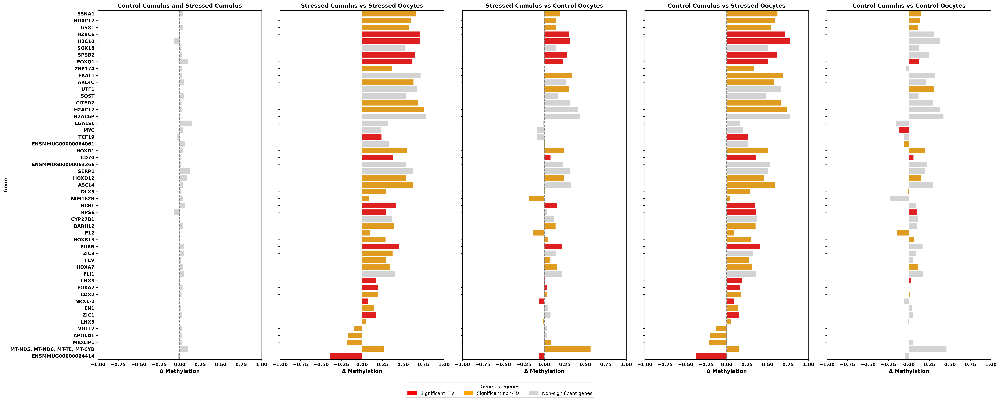

In [71]:
# less genes


import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['savefig.transparent'] = True
matplotlib.rcParams['path.simplify'] = False  # keep exact vectors

# ── Define reference order from Control vs Stressed Oocytes ──
# ── Build reference order from Control Oocytes vs Stressed Oocytes (if not already built) ──
ref_comp = comparisons["Control Oocytes and Stressed Oocytes"].copy()
if not ref_comp.empty:
    ref_comp["genename"] = ref_comp.apply(
        lambda r: r["gene"] if (pd.isna(r["genename"]) or str(r["genename"]).strip() == "") else r["genename"],
        axis=1
    )
    # optional: base order only on significant/TFs in the reference comparison
    ref_for_order = ref_comp[(ref_comp["significant"]) | (ref_comp["is_tf"])]
    if ref_for_order.empty:
        ref_for_order = ref_comp
    reference_order = ref_for_order.sort_values("delta", ascending=True)["genename"].tolist()
else:
    reference_order = None

# ── Prepare plotting ──
outdir = "figure6/comparison_outputs_cross_multi"
os.makedirs(outdir, exist_ok=True)

# Exclude the oocyte vs oocyte baseline
plot_comparisons = {k: v for k, v in comparisons.items() if k != "Control Oocytes and Stressed Oocytes"}

n = len(plot_comparisons)
fig, axes = plt.subplots(1, n, figsize=(6*n, 12), sharey=True)

if n == 1:
    axes = [axes]  # ensure iterable

for ax, (name, res) in zip(axes, plot_comparisons.items()):
    if res.empty:
        print(f"⚠️ No results for {name}, skipping panel.")
        continue

    # Fallback genename
    res["genename"] = res.apply(
        lambda row: row["gene"] if pd.isna(row["genename"]) else row["genename"], axis=1
    )

    # Apply consistent order
    if reference_order is not None:
        res["genename"] = pd.Categorical(res["genename"], categories=reference_order, ordered=True)

    # Colors
    colors = [
        "red" if row["significant"] and row["is_tf"]
        else "orange" if row["significant"]
        else "lightgray"
        for _, row in res.iterrows()
    ]

    sns.barplot(
        data=res.sort_values("genename"),  # respect reference order
        x="delta", y="genename", palette=colors, dodge=False, ax=ax
    )

    ax.axvline(0, linestyle="--", color="gray")
    ax.set_title(name.replace("_", " "), fontsize=12, fontweight="bold")
    #ax.set_xlabel("Δ Methylation")
    ax.set_xlabel("Δ Methylation", fontsize=11, fontweight="bold")
    ax.set_ylabel("Gene", fontsize=11, fontweight="bold")

        # ✅ keep consistent x-axis across animals
    ax.set_xlim(-1, 1)

        # ✅ bold ticksax.set_xticks
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontweight("bold")
        
    if ax == axes[0]:
        ax.set_ylabel("Gene")
    else:
        ax.set_ylabel("")
        
for ax in axes:
    ax.set_xlim(-1, 1)

        
# Legend (global)
legend_patches = [
    mpatches.Patch(color="red", label="Significant TFs"),
    mpatches.Patch(color="orange", label="Significant non-Tfs"),
    mpatches.Patch(color="lightgray", label="Non-significant genes")
]
fig.legend(handles=legend_patches, title="Gene Categories", loc="lower center", ncol=3)

plt.tight_layout(rect=[0, 0.05, 1, 1])  # leave space for legend
#plt.savefig(f"{outdir}/multi_panel_barplots_forfig6.pdf",)
plt.savefig(f"{outdir}/panelA_lessgenes_forfig7.pdf", bbox_inches="tight")
plt.show()


In [29]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

def compare_cross(df, stage1, group1, stage2, group2, value_col="beta"):
    """
    Compare per-gene methylation fractions between two Stage/Group subsets.
    Returns a DataFrame with delta, pval, FDR, significance flags.
    """
    results = []
    sub1 = df[(df["Stage"] == stage1) & (df["Group"] == group1)]
    sub2 = df[(df["Stage"] == stage2) & (df["Group"] == group2)]

    for gene in set(sub1["gene"]).intersection(sub2["gene"]):
        vals1 = sub1.loc[sub1["gene"] == gene, value_col].dropna()
        vals2 = sub2.loc[sub2["gene"] == gene, value_col].dropna()

        if len(vals1) > 1 and len(vals2) > 1:
            _, pval = ttest_ind(vals2, vals1, equal_var=False)
        else:
            pval = 1.0

        results.append({
            "gene": gene,
            "genename": gene_name_map.get(gene, gene),
            f"{stage1}_{group1}_mean": vals1.mean(),
            f"{stage2}_{group2}_mean": vals2.mean(),
            "delta": vals2.mean() - vals1.mean(),
            "pval": pval
        })

    res = p# ── Build reference order from Control Oocytes vs Stressed Oocytes (if not already built) ──
ref_comp = comparisons["Control Oocytes and Stressed Oocytes"].copy()
if not ref_comp.empty:
    ref_comp["genename"] = ref_comp.apply(
        lambda r: r["gene"] if (pd.isna(r["genename"]) or str(r["genename"]).strip() == "") else r["genename"],
        axis=1
    )
    # optional: base order only on significant/TFs in the reference comparison
    ref_for_order = ref_comp[(ref_comp["significant"]) | (ref_comp["is_tf"])]
    if ref_for_order.empty:
        ref_for_order = ref_comp
    reference_order = ref_for_order.sort_values("delta", ascending=True)["genename"].tolist()
else:
    reference_order = Noned.DataFrame(results)
    if not res.empty:
        res["fdr"] = multipletests(res["pval"], method="fdr_bh")[1]
        res["significant"] = (res["fdr"] < 0.05) & (res["delta"].abs() > 0.1)
        res["is_tf"] = res["genename"].isin(highlight_tfs)
    return res


# ── Run cross-comparisons ──
comparisons = {
    "StressedCumulus_vs_StressedOocytes": compare_cross(df, "Oocyte", "Stressed", "Cumulus", "Stressed"),
    "StressedCumulus_vs_ControlOocytes": compare_cross(df, "Oocyte", "Control", "Cumulus", "Stressed"),
    "ControlCumulus_vs_StressedOocytes": compare_cross(df, "Oocyte", "Stressed", "Cumulus", "Control"),
    "ControlCumulus_vs_ControlOocytes": compare_cross(df, "Oocyte", "Control", "Cumulus", "Control"),
}

# ── Output and plotting ──
outdir = "cumulus-nonNorm/comparison_outputs_cross"
os.makedirs(outdir, exist_ok=True)

for name, res in comparisons.items():
    res.to_csv(f"{outdir}/{name}.csv", index=False)

    if res.empty:
        print(f"⚠️ No results for {name}, skipping plot.")
        continue

    height = min(0.25 * len(res), 20)
    plt.figure(figsize=(10, height))

    colors = [
        "red" if row["significant"] and row["is_tf"]
        else "blue" if row["is_tf"]
        else "orange" if row["significant"]
        else "lightgray"
        for _, row in res.iterrows()
    ]

    sns.barplot(
        data=res.sort_values("delta", ascending=False),
        x="delta", y="genename", palette=colors, dodge=False
    )
    plt.axvline(0, linestyle="--", color="gray")
    plt.title(name.replace("_", " "), fontsize=14, fontweight="bold")
    plt.xlabel("Δ Methylation ", fontsize=12, fontweight="bold")
    plt.ylabel("Gene", fontsizeimport os

=12, fontweight="bold")

    legend_patches = [
        mpatches.Patch(color="red", label="Significant TF"),
        mpatches.Patch(color="blue", label="TF (not significant)"),
        mpatches.Patch(color="orange", label="Significant gene"),
        mpatches.Patch(color="lightgray", label="Other gene")
    ]
    plt.legend(handles=legend_patches, title="Gene Categories",
               fontsize=10, title_fontsize=11, loc="lower right")

    plt.tight_layout()
    plt.savefig(f"{outdir}/{name}_barplot.png", dpi=300)
    plt.show()


SyntaxError: invalid syntax (2183767541.py, line 81)

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel
import os

def plot_gene_per_animal_barplots(df, genes, outdir="cumulus-nonNorm/comparison_outputs_within_animal/per_gene_barplots"):
    """
    For each gene, plot barplots of Oocyte vs Cumulus methylation per AnimalID.
    """
    os.makedirs(outdir, exist_ok=True)

    for gene in genes:
        sub = df[df["gene"] == gene].copy()
        if sub.empty:
            print(f"⚠️ No data for {gene}, skipping")
            continue

        # Compute per-animal mean β for each stage
        sub_means = (
            sub.groupby(["AnimalID","Stage"])["beta"]
               .mean()
               .reset_index()
        )
        # Keep animals that have both Oocyte & Cumulus
        counts = sub_means["AnimalID"].value_counts()
        common_animals = counts[counts == 2].index
        sub_means = sub_means[sub_means["AnimalID"].isin(common_animals)]

        if sub_means.empty:
            print(f"⚠️ No paired animals for {gene}, skipping")
            continue

        # Paired test across animals
        oocyte_vals = sub_means[sub_means["Stage"]=="Oocyte"].set_index("AnimalID")["beta"]
        cumulus_vals = sub_means[sub_means["Stage"]=="Cumulus"].set_index("AnimalID")["beta"]
        common_ids = oocyte_vals.index.intersection(cumulus_vals.index)
        pval = 1.0
        if len(common_ids) > 1:
            _, pval = ttest_rel(cumulus_vals.loc[common_ids], oocyte_vals.loc[common_ids])

        # Plot barplot
        plt.figure(figsize=(10,5))
        sns.barplot(
            data=sub_means,
            x="AnimalID", y="beta", hue="Stage",
            palette={"Oocyte":"skyblue", "Cumulus":"salmon"}
        )

        plt.title(f"{gene_name_map.get(gene,gene)} (Cumulus vs Oocyte)\nPaired t-test p={pval:.3f}",
                  fontsize=13, fontweight="bold")
        plt.ylabel("Methylation (β)")
        plt.xlabel("AnimalID")
        plt.legend(title="Stage")
        plt.xticks(rotation=45)

        plt.tight_layout()
        plt.savefig(f"{outdir}/{gene}_per_animal_barplot.png", dpi=300)
        plt.show()


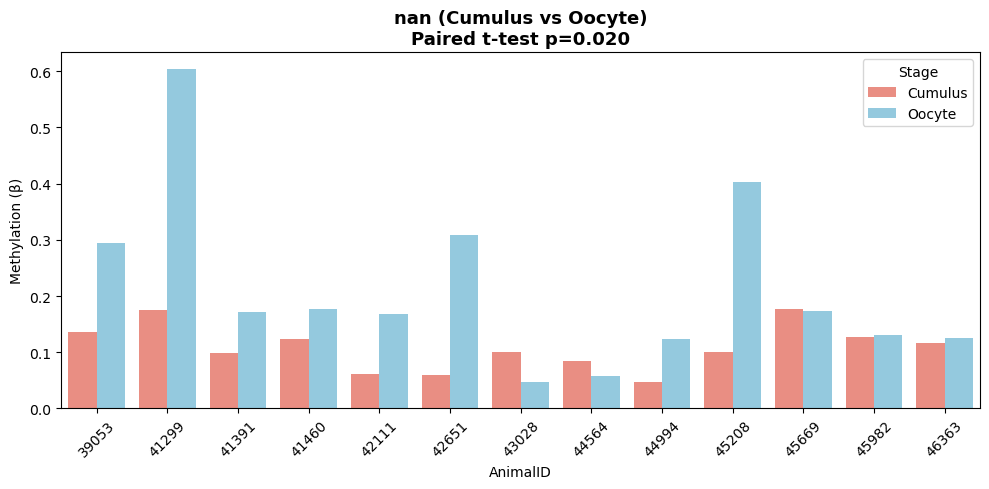

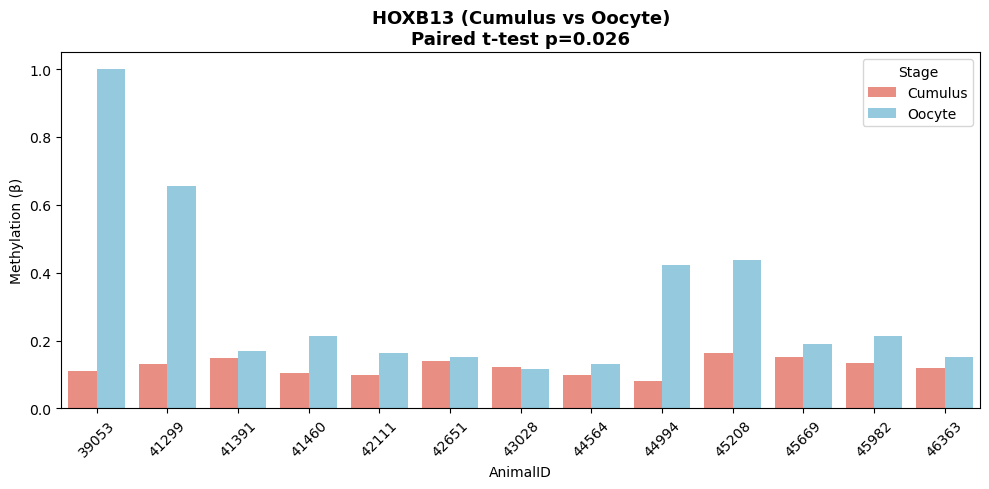

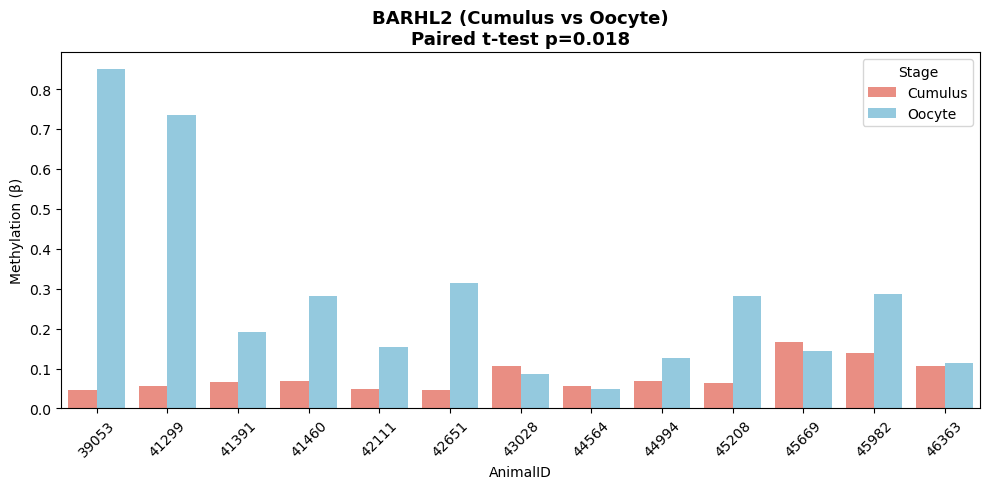

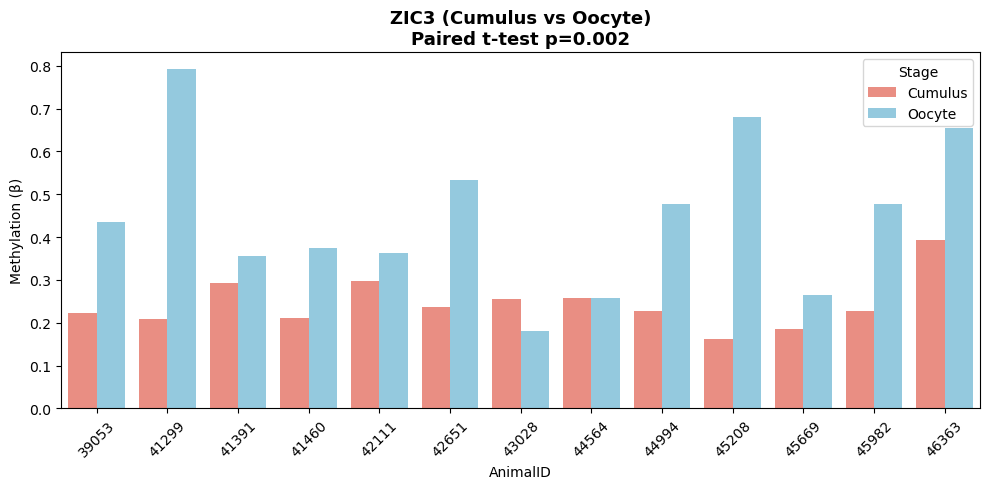

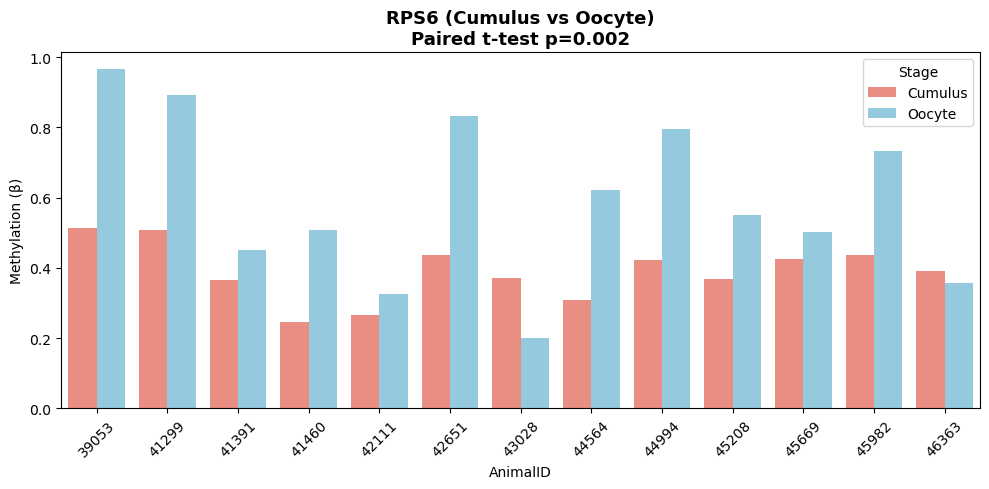

In [55]:
# Example: plot for first 5 significant genes
genes_to_plot = res.query("significant")["gene"].head(5).tolist()
plot_gene_per_animal_barplots(df, genes_to_plot)


/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


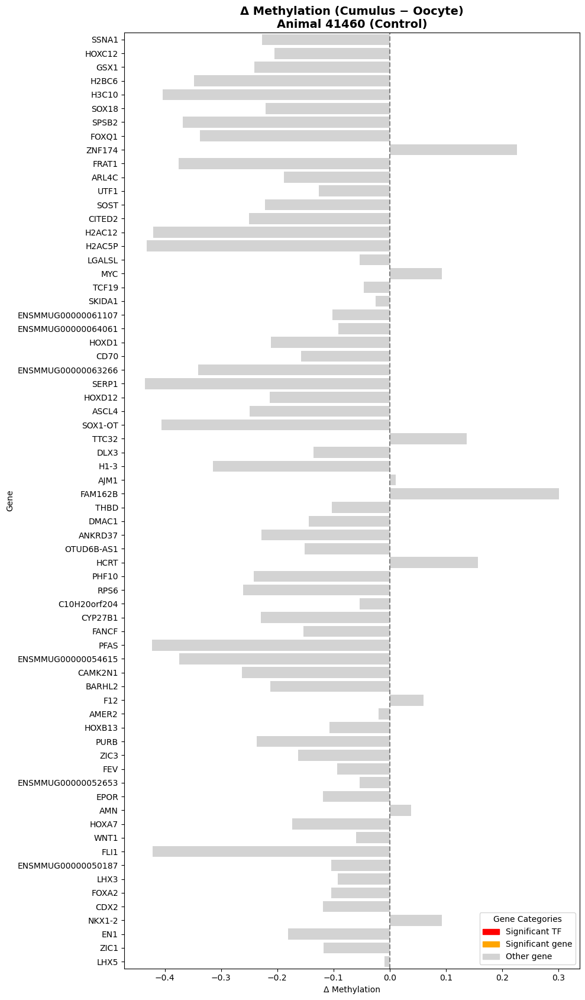

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


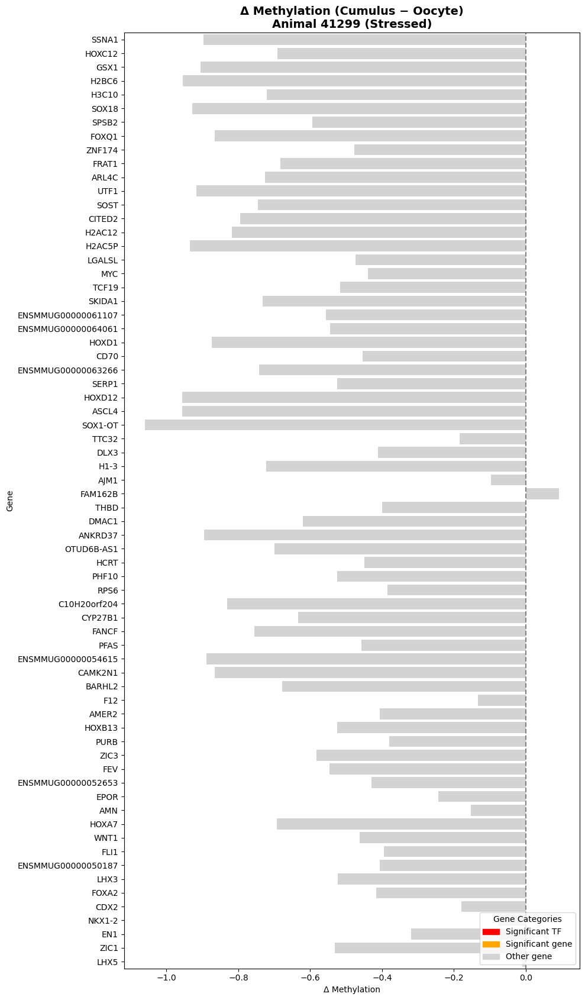

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


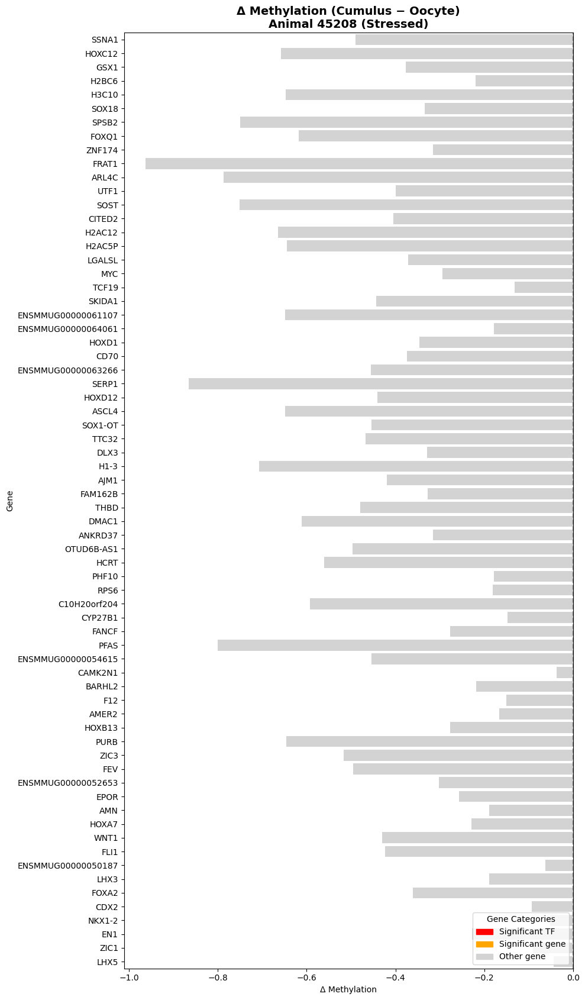

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


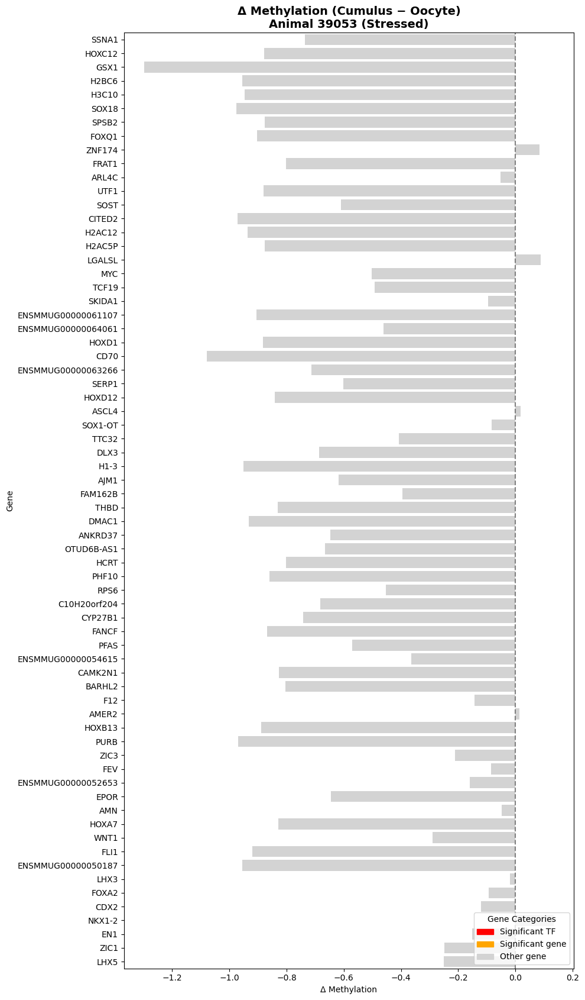

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


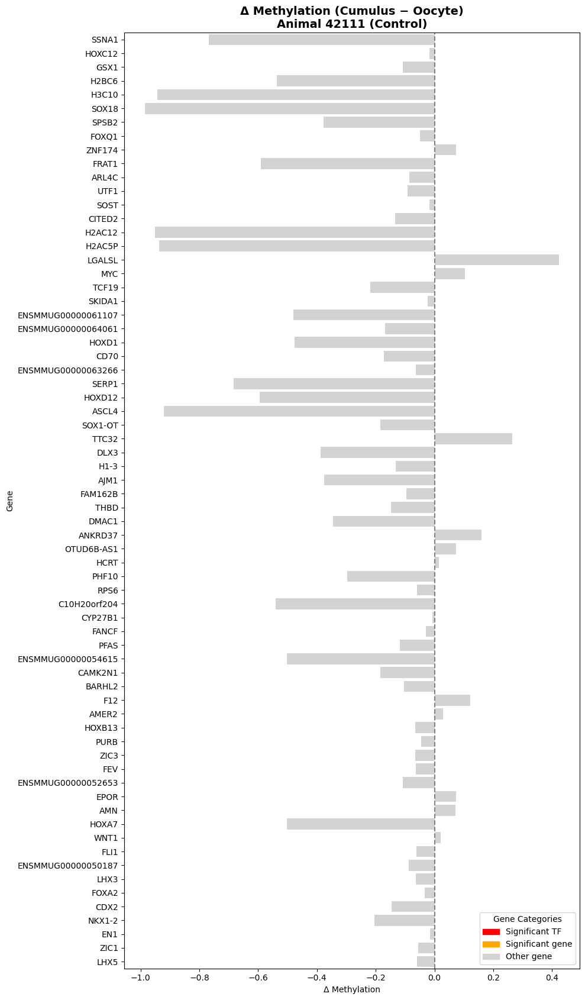

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


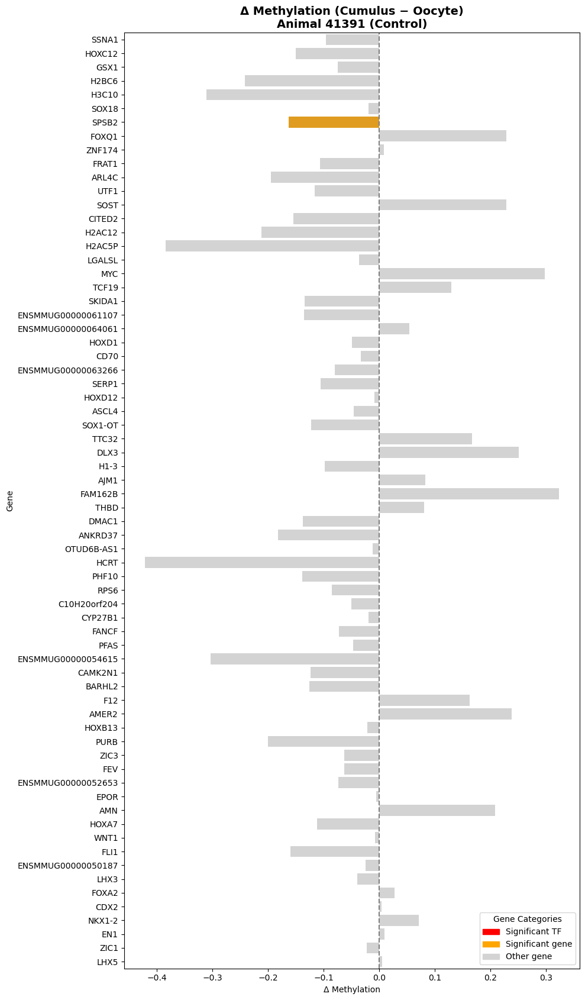

/tmp/ipykernel_3530937/2796478576.py:39: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  _, pval = ttest_ind(cumulus_vals, oocyte_vals, equal_var=False)
/tmp/ipykernel_3530937/2796478576.py:39: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  _, pval = ttest_ind(cumulus_vals, oocyte_vals, equal_var=False)
/tmp/ipykernel_3530937/2796478576.py:39: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  _, pval = ttest_ind(cumulus_vals, oocyte_vals, equal_var=False)
/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` varia

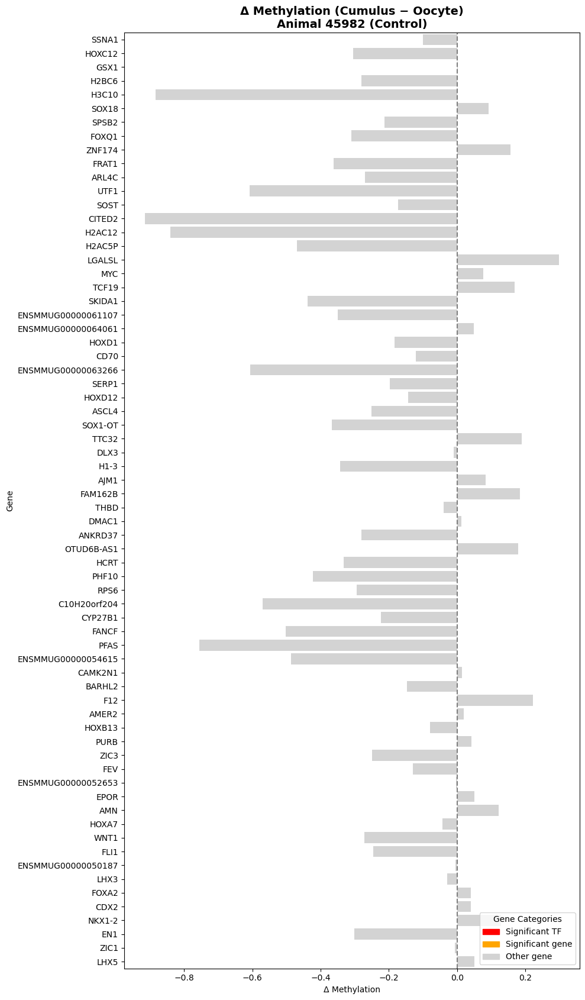

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


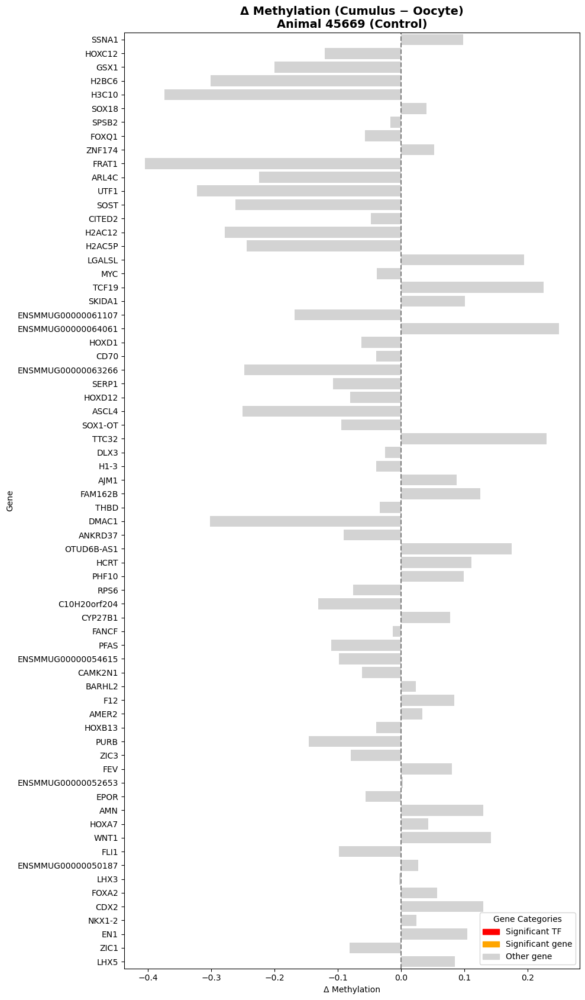

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


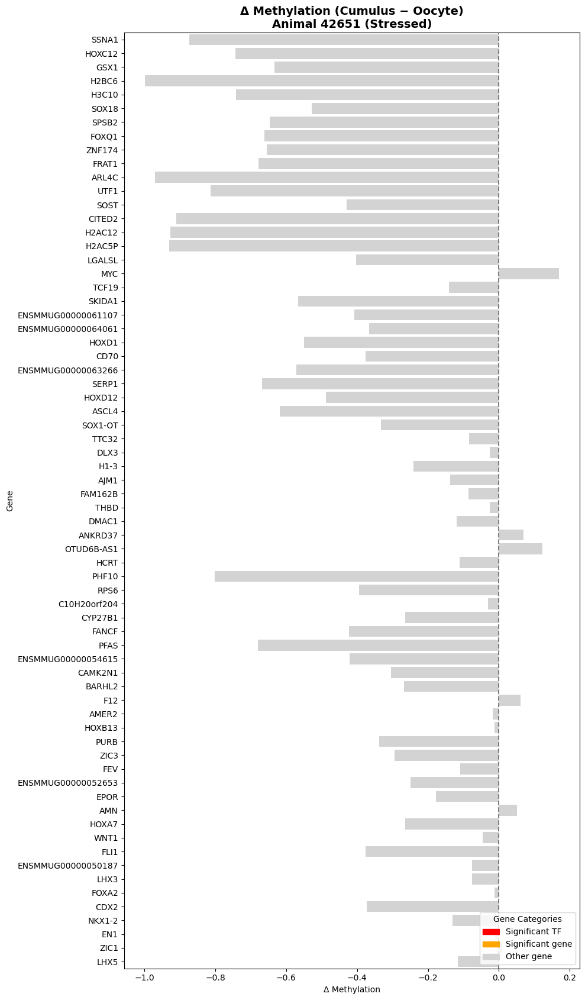

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


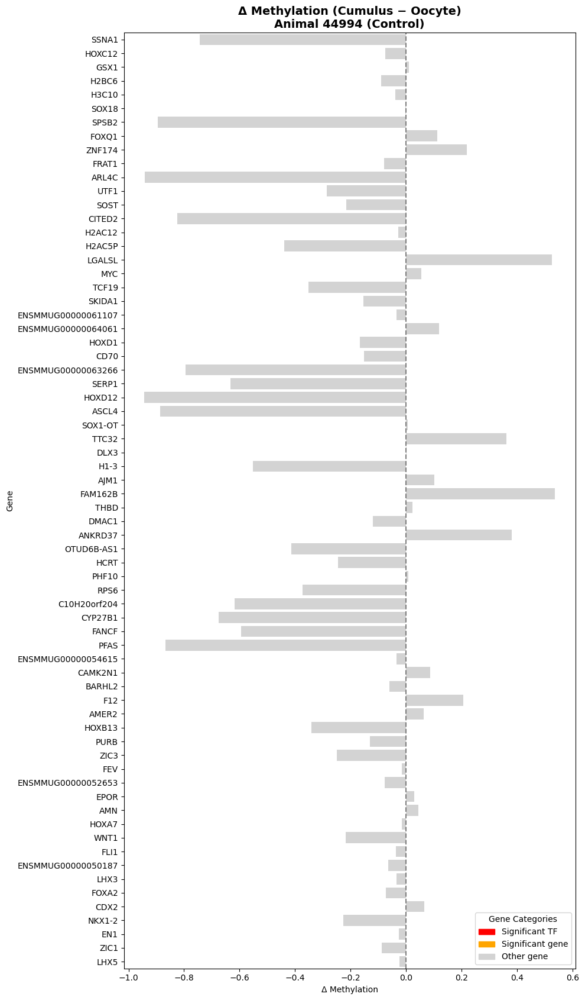

/tmp/ipykernel_3530937/2796478576.py:39: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  _, pval = ttest_ind(cumulus_vals, oocyte_vals, equal_var=False)
/tmp/ipykernel_3530937/2796478576.py:39: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  _, pval = ttest_ind(cumulus_vals, oocyte_vals, equal_var=False)
/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


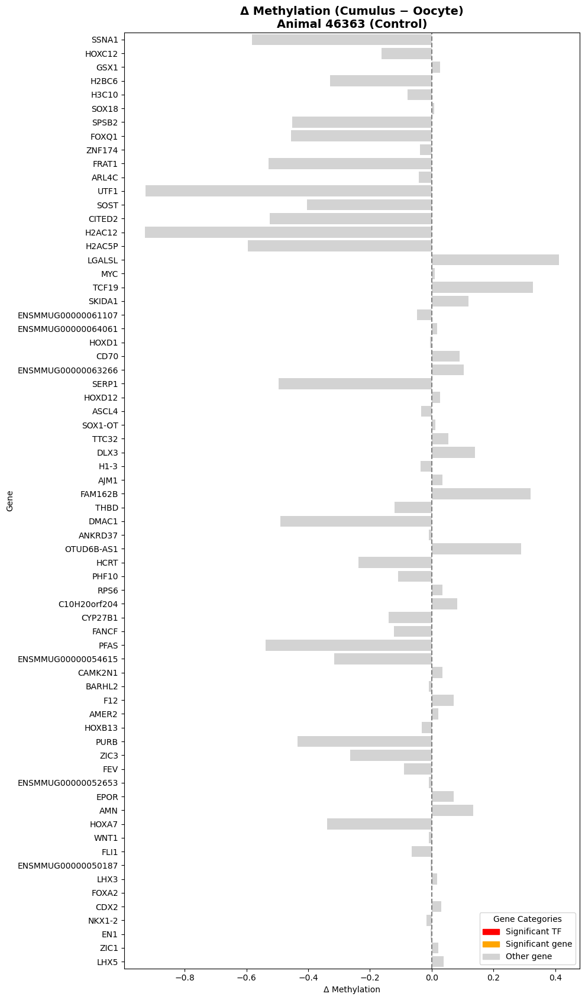

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


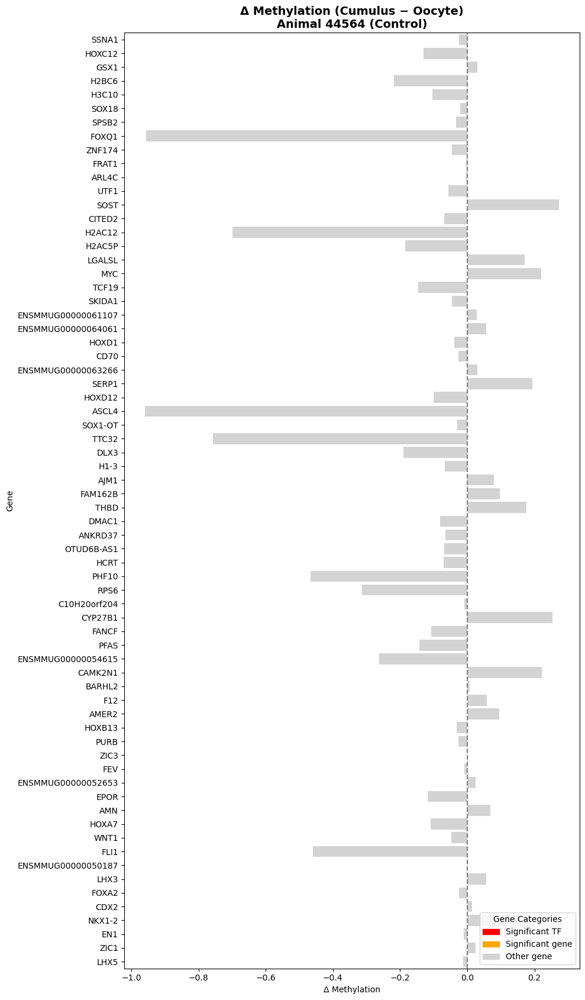

/tmp/ipykernel_3530937/2796478576.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)


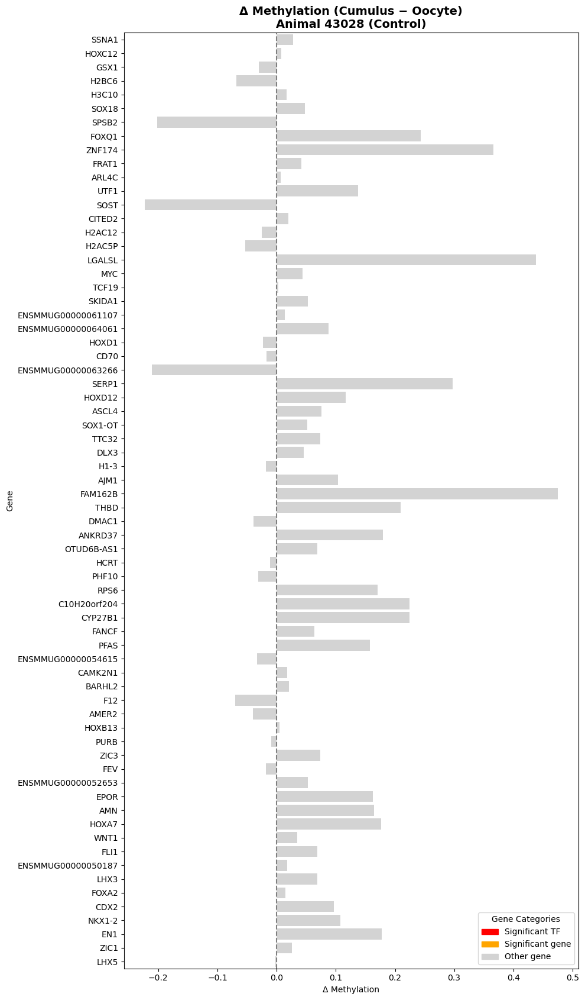

In [69]:
#usng tetst_ind
def per_animal_cumulus_vs_oocyte(df, outdir="cumulus-nonNorm/per_animal_cumulus_oocyte"):
    os.makedirs(outdir, exist_ok=True)

    results = []
    animals = df["AnimalID"].unique()

    for animal in animals:
        df_animal = df[df["AnimalID"] == animal]

        if not {"Oocyte", "Cumulus"} <= set(df_animal["Stage"].unique()):
            continue  # skip animals missing one stage

        # Get group (should be unique for this animal)
        group = df_animal["Group"].unique()
        if len(group) == 1:
            group = group[0]
        else:
            group = "Mixed"  # safeguard in case of issues

        # mean methylation per gene & stage
        mean_df = df_animal.groupby(["gene","Stage"])["beta"].mean().unstack()
        if "Oocyte" not in mean_df.columns or "Cumulus" not in mean_df.columns:
            continue

        mean_df["delta"] = mean_df["Cumulus"] - mean_df["Oocyte"]

        # add gene names
        mean_df = mean_df.reset_index()
        mean_df["genename"] = mean_df["gene"].map(gene_id_to_name).fillna(mean_df["gene"])
        mean_df["is_tf"] = mean_df["genename"].isin(highlight_tfs)

        # per-gene t-tests
        pvals = []
        for gene in mean_df["gene"]:
            oocyte_vals = df_animal.query("gene == @gene and Stage == 'Oocyte'")["beta"]
            cumulus_vals = df_animal.query("gene == @gene and Stage == 'Cumulus'")["beta"]
            if len(oocyte_vals) > 1 and len(cumulus_vals) > 1:
                _, pval = ttest_ind(cumulus_vals, oocyte_vals, equal_var=False)
            else:
                pval = 1.0
            pvals.append(pval)

        mean_df["pval"] = pvals
        mean_df["fdr"] = multipletests(mean_df["pval"], method="fdr_bh")[1]
        mean_df["significant"] = (mean_df["fdr"] < 0.1) & (mean_df["delta"].abs() > 0.05)

        # save results
        mean_df.to_csv(f"{outdir}/animal_{animal}_{group}_cumulus_vs_oocyte.csv", index=False)
        # ── Plot with reference order ──
        mean_df = mean_df.set_index("genename").reindex(reference_order).reset_index()
        colors = [
        "red" if (row["significant"] and row["is_tf"]) else
        "orange" if row["significant"] else
        "lightgray"
        for _, row in mean_df.iterrows()
        ]

       
        plt.figure(figsize=(10, max(6, 0.25*len(mean_df))))
        sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False)

        legend_patches = [
            mpatches.Patch(color='red', label='Significant TF'),
           # mpatches.Patch(color='blue', label='TF (not significant)'),
            mpatches.Patch(color='orange', label='Significant gene'),
            mpatches.Patch(color='lightgray', label='Other gene')
        ]
        plt.legend(handles=legend_patches, title="Gene Categories", loc="lower right")

        plt.axvline(0, linestyle="--", color="gray")
        plt.title(f"Δ Methylation (Cumulus − Oocyte)\nAnimal {animal} ({group})", 
                  fontsize=14, fontweight="bold")
        plt.xlabel("Δ Methylation")
        plt.ylabel("Gene")
        plt.tight_layout()
        plt.savefig(f"{outdir}/animal_{animal}_{group}_cumulus_vs_oocyte_barplot.png", dpi=300)
        plt.show()

        results.append(mean_df)

    return results

# ── Run ── 
all_results = per_animal_cumulus_vs_oocyte(df)

In [72]:
#indttest combined

def per_animal_cumulus_vs_oocyte_combined(df, outdir="cumulus-nonNorm/per_animal_cumulus_oocyte/combined"):
    """
    Combine per-animal Δ methylation (Cumulus − Oocyte) plots into one multi-panel figure.
    Uses paired t-test (ttest_rel) with FDR correction within each animal.
    """
    os.makedirs(outdir, exist_ok=True)

    # ✅ Only keep animals with both stages
    valid_animals = []
    for animal in df["AnimalID"].unique():
        stages = df.loc[df["AnimalID"] == animal, "Stage"].unique()
        if {"Oocyte", "Cumulus"} <= set(stages):
            valid_animals.append(animal)

    n_animals = len(valid_animals)
    if n_animals == 0:
        print("⚠️ No animals with both Oocyte and Cumulus samples.")
        return

    # subplot grid
    ncols = 4
    nrows = int(np.ceil(n_animals / ncols))

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=(15, 5 * nrows),
                             squeeze=False)

    results = []

    for idx, animal in enumerate(valid_animals):
        ax = axes[idx // ncols, idx % ncols]
        df_animal = df[df["AnimalID"] == animal]

        # group-level check
        group = df_animal["Group"].unique()
        group = group[0] if len(group) == 1 else "Mixed"

        # mean methylation per gene & stage
        mean_df = df_animal.groupby(["gene","Stage"])["beta"].mean().unstack()
        if "Oocyte" not in mean_df.columns or "Cumulus" not in mean_df.columns:
            ax.set_axis_off()
            continue

        mean_df["delta"] = mean_df["Cumulus"] - mean_df["Oocyte"]
        mean_df = mean_df.reset_index()
        mean_df["genename"] = mean_df["gene"].map(gene_id_to_name).fillna(mean_df["gene"])
        mean_df["is_tf"] = mean_df["genename"].isin(highlight_tfs)

        # per-gene paired t-tests
        pvals = []
        for gene in mean_df["gene"]:
            oocyte_vals = df_animal.query("gene == @gene and Stage == 'Oocyte'")["beta"].values
            cumulus_vals = df_animal.query("gene == @gene and Stage == 'Cumulus'")["beta"].values
            min_len = min(len(oocyte_vals), len(cumulus_vals))
            if min_len > 1:
                _, pval = ttest_ind(cumulus_vals, oocyte_vals,  equal_var=False)
            else:
                pval = 1.0
            pvals.append(pval)

        mean_df["pval"] = pvals
        mean_df["fdr"] = multipletests(mean_df["pval"], method="fdr_bh")[1]
        mean_df["significant"] = (mean_df["fdr"] < 0.1) & (mean_df["delta"].abs() > 0.05)

        # reorder to match reference_order if available
        if "reference_order" in globals():
            mean_df = mean_df.set_index("genename").reindex(reference_order).reset_index()

        results.append(mean_df)

        # colors
        colors = [
            "red" if (row["significant"] and row["is_tf"]) else
            "orange" if row["significant"] else
            "lightgray"
            for _, row in mean_df.iterrows()
        ]

        # plot
        sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False, ax=ax)
        ax.axvline(0, linestyle="--", color="gray")
        ax.tick_params(axis="y", labelsize=5)   # adjust 8 → 10, 12, etc.
        ax.set_title(f"Animal {animal} ({group})", fontsize=12, fontweight="bold")
        ax.set_xlabel("Δ Methylation")
        ax.set_ylabel("Gene")
        ax.set_xlim(-1.0,1)

    # turn off empty panels if grid > animals
    for j in range(idx + 1, nrows * ncols):
        axes[j // ncols, j % ncols].set_axis_off()

    # legend
    legend_patches = [
        mpatches.Patch(color='red', label='Significant TF'),
        mpatches.Patch(color='orange', label='Significant gene'),
        mpatches.Patch(color='lightgray', label='Other gene')
    ]
    fig.legend(handles=legend_patches, title="Gene Categories",
               loc="lower center", ncol=3, bbox_to_anchor=(0.5, 0.02))
    
    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.savefig(f"{outdir}/all_animals_barplots_comined_pooled_hyper_indttest.png", dpi=300)
    plt.show()

    return results


/tmp/ipykernel_3530937/2510464677.py:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False, ax=ax)
/tmp/ipykernel_3530937/2510464677.py:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False, ax=ax)
/tmp/ipykernel_3530937/2510464677.py:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False, ax=ax)
/tmp/ipykernel_3530937/2510464677.py:82: FutureWarning: 

Pas

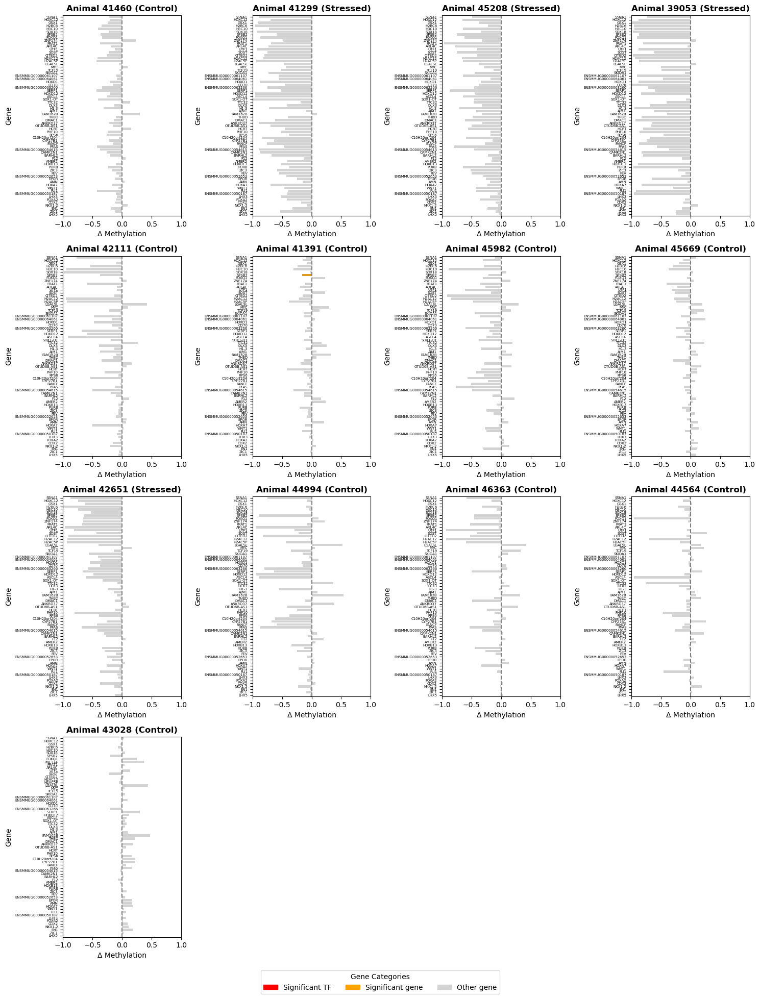

In [73]:
genes = df["gene"].unique()  # or pick a subset: ["ENSG00001", "ENSG00002"]

all_results = per_animal_cumulus_vs_oocyte_combined(df)


In [76]:
#reltest combined
def per_animal_cumulus_vs_oocyte_combined(df, outdir="cumulus-nonNorm/per_animal_cumulus_oocyte_relttest/combined"):
    """
    Combine per-animal Δ methylation (Cumulus − Oocyte) plots into one multi-panel figure.
    Uses paired t-test (ttest_rel) with FDR correction within each animal.
    """
    os.makedirs(outdir, exist_ok=True)

    # ✅ Only keep animals with both stages
    valid_animals = []
    for animal in df["AnimalID"].unique():
        stages = df.loc[df["AnimalID"] == animal, "Stage"].unique()
        if {"Oocyte", "Cumulus"} <= set(stages):
            valid_animals.append(animal)

    n_animals = len(valid_animals)
    if n_animals == 0:
        print("⚠️ No animals with both Oocyte and Cumulus samples.")
        return

    # subplot grid
    ncols = 4
    nrows = int(np.ceil(n_animals / ncols))

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=(15, 5 * nrows),
                             squeeze=False)

    results = []

    for idx, animal in enumerate(valid_animals):
        ax = axes[idx // ncols, idx % ncols]
        df_animal = df[df["AnimalID"] == animal]

        # group-level check
        group = df_animal["Group"].unique()
        group = group[0] if len(group) == 1 else "Mixed"

        # mean methylation per gene & stage
        mean_df = df_animal.groupby(["gene","Stage"])["beta"].mean().unstack()
        if "Oocyte" not in mean_df.columns or "Cumulus" not in mean_df.columns:
            ax.set_axis_off()
            continue

        mean_df["delta"] = mean_df["Cumulus"] - mean_df["Oocyte"]
        mean_df = mean_df.reset_index()
        mean_df["genename"] = mean_df["gene"].map(gene_id_to_name).fillna(mean_df["gene"])
        mean_df["is_tf"] = mean_df["genename"].isin(highlight_tfs)

        # per-gene paired t-tests
        pvals = []
        for gene in mean_df["gene"]:
            oocyte_vals = df_animal.query("gene == @gene and Stage == 'Oocyte'")["beta"].values
            cumulus_vals = df_animal.query("gene == @gene and Stage == 'Cumulus'")["beta"].values
            min_len = min(len(oocyte_vals), len(cumulus_vals))
            if min_len > 1:
                _, pval = ttest_rel(cumulus_vals[:min_len], oocyte_vals[:min_len])
            else:
                pval = 1.0
            pvals.append(pval)

        mean_df["pval"] = pvals
        mean_df["fdr"] = multipletests(mean_df["pval"], method="fdr_bh")[1]
        mean_df["significant"] = (mean_df["fdr"] < 0.1) & (mean_df["delta"].abs() > 0.05)

        # reorder to match reference_order if available
        if "reference_order" in globals():
            mean_df = mean_df.set_index("genename").reindex(reference_order).reset_index()

        results.append(mean_df)

        # colors
        colors = [
            "red" if (row["significant"] and row["is_tf"]) else
            "orange" if row["significant"] else
            "lightgray"
            for _, row in mean_df.iterrows()
        ]

        # plot
        sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False, ax=ax)
        ax.axvline(0, linestyle="--", color="gray")
        ax.tick_params(axis="y", labelsize=5)   # adjust 8 → 10, 12, etc.
        ax.set_title(f"Animal {animal} ({group})", fontsize=12, fontweight="bold")
        ax.set_xlabel("Δ Methylation")
        ax.set_ylabel("Gene")
        ax.set_xlim(-1.0,1)

    # turn off empty panels if grid > animals
    for j in range(idx + 1, nrows * ncols):
        axes[j // ncols, j % ncols].set_axis_off()

    # legend
    legend_patches = [
        mpatches.Patch(color='red', label='Significant TF'),
        mpatches.Patch(color='orange', label='Significant gene'),
        mpatches.Patch(color='lightgray', label='Other gene')
    ]
    fig.legend(handles=legend_patches, title="Gene Categories",
               loc="lower center", ncol=3, bbox_to_anchor=(0.5, 0.02))

    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.savefig(f"{outdir}/all_animals_barplots_comined_pooled_hyper.png", dpi=300)
    plt.show()

    return results


/tmp/ipykernel_3530937/3935062170.py:81: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False, ax=ax)
/tmp/ipykernel_3530937/3935062170.py:81: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False, ax=ax)
/tmp/ipykernel_3530937/3935062170.py:81: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=mean_df, x="delta", y="genename", palette=colors, dodge=False, ax=ax)
/tmp/ipykernel_3530937/3935062170.py:81: FutureWarning: 

Pas

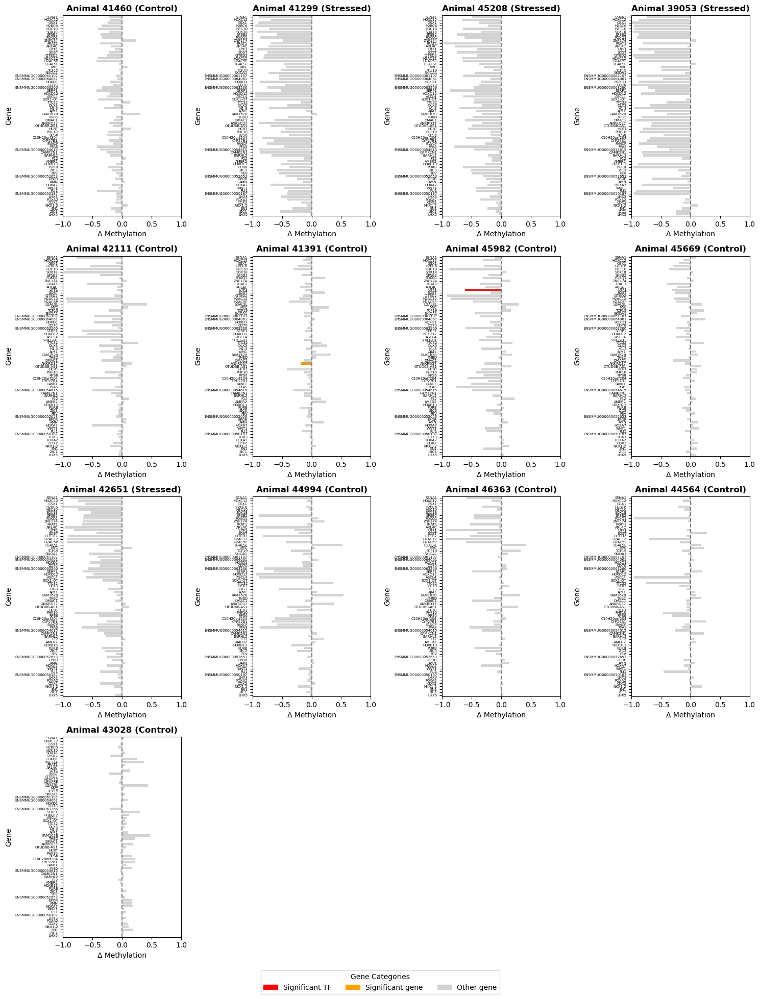

In [77]:
genes = df["gene"].unique()  # or pick a subset: ["ENSG00001", "ENSG00002"]

all_results = per_animal_cumulus_vs_oocyte_combined(df)
